# Mid/High-Frequency User Oriented Dataset - UMAP
- UDD/MDS18/PP4
- Final Project: 'Studying Twitter User Accounts: Spotting Suspicious Social Bot Behavior'
- Master Candidate: Marcelo Rovai
- Professors:	   
    - Eduardo Graells-Garrido (Supervisor)
    - Loreto Bravo
    - Leo Ferres

## Main Libraries & Setup

In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.datasets import load_iris, load_digits
from sklearn.model_selection import train_test_split
import umap

In [4]:
from bokeh.plotting import figure, show, output_notebook
from bokeh.models import HoverTool, ColumnDataSource, CategoricalColorMapper
from bokeh.palettes import Spectral10

output_notebook()

Loading BokehJS ...

In [5]:
import warnings
warnings.filterwarnings('ignore')

In [6]:
pd.set_option('display.float_format', lambda x: '%.f' % x)
sns.set_context("paper",
                rc={
                    "font.size": 12,
                    "axes.titlesize": 12,
                    "axes.labelsize": 12,
                    'figure.figsize': (14, 10)
                })

## Main Functions

In [7]:
def plot_feature(df, feat, kde=True, prt=False, save_file_name=None, x_max = None):
    f, axes = plt.subplots(ncols=1, figsize=(10, 4))
    sns.despine(left=True)
    sns.distplot(df[feat],
                 color="m",
                 hist=False,
                 kde=kde,
                 kde_kws={
                     'shade': True,
                     'linewidth': 3
                 })
    plt.suptitle(feat + " distribution", fontsize=20)
    plt.xlabel(feat,fontsize=15)
    plt.setp(axes, yticks=[])
    plt.xlim(0, x_max)

    if prt == True:
        plt.savefig("../images/"+save_file_name, bbox_inches='tight')

In [8]:
def get_df_name(df):
    name =[x for x in globals() if globals()[x] is df][0]
    return name

In [9]:
def plot_feat_comp(df1,
                   df2,
                   feat,
                   color1='m',
                   color2='g',
                   prt=False,
                   x_max=None,
                  log=False):
    feat1 = df1[feat]
    feat2 = df2[feat]
    label_1 = get_df_name(df1)
    label_2 = get_df_name(df2)
    fig, axes = plt.subplots(ncols=1, figsize=(10, 5))

    #fig = plt.figure(figsize = (10,5))
    ax = sns.distplot(feat1,
                      color=color1,
                      label=label_1,
                      hist=False,
                      kde=True,
                      kde_kws={
                          'shade': True,
                          'linewidth': 3
                      })
    plt.xlim(x_max)
    if log:
        ax.set_xscale('log')
    
    ax = sns.distplot(feat2,
                      color=color2,
                      label=label_2,
                      hist=False,
                      kde=True,
                      kde_kws={
                          'shade': True,
                          'linewidth': 3
                      })
    plt.xlim(x_max)
    if log:
        ax.set_xscale('log')
    
    plt.suptitle(label_1 + "-" + label_2 + "  " + feat + ' distribution',
                 fontsize=16)
    sns.despine(left=True)
    plt.setp(axes, yticks=[])

    if prt == True:
        plt.savefig("../images/" + label_1 + "-" + label_2 + "-" + feat+'.png',
                    bbox_inches='tight')

In [2]:
def plot_feat_comp_2_graph(df1,
                           df2,
                           feat,
                           color1='m',
                           color2='g',
                           prt=False,
                           log=False):
    feat1 = df1[feat]
    feat2 = df2[feat]
    label_1 = get_df_name(df1)
    label_2 = get_df_name(df2)
    f, axes = plt.subplots(ncols=2, figsize=(10, 4))
    sns.despine(left=True)
    ax = sns.distplot(feat1,
                      color=color1,
                      label=label_1,
                      hist=False,
                      kde=True,
                      kde_kws={
                          'shade': True,
                          'linewidth': 3
                      },
                      ax=axes[0])

    if log:
        ax.set_xscale('log')

    ax = sns.distplot(feat2,
                      color=color2,
                      label=label_2,
                      hist=False,
                      kde=True,
                      kde_kws={
                          'shade': True,
                          'linewidth': 3
                      },
                      ax=axes[1])

    if log:
        ax.set_xscale('log')

    plt.suptitle(label_1 + "-" + label_2 + "  " + feat + " distribution",
                 fontsize=16)
    plt.setp(axes, yticks=[])

    if prt == True:
        plt.savefig("../images/" + label_1 + "-" + label_2 + "-" + feat+'.png',
                    bbox_inches='tight')

## Import Dataset

In [10]:
ls ../data/

20_tweets_nov_2017.csv             50_user_metrics_final.csv
30_tweets_nov_2017_final.csv       60_user_metrics_label.csv
40_user_metrics.csv                df_user_description.csv
45_user_adit_clean_metrics.csv     select_tweet_feat_description.csv


In [11]:
df = pd.read_csv("../data/60_user_metrics_label.csv", lineterminator='\n', low_memory=False)
df.shape

(91154, 34)

In [12]:
df.head(2)

,Unnamed: 0,user,default_prof_image,acc_verif,local_bol,default_profile,descr_bol,active_acc,tws_cnt,frs_cnt,...,mean_urls,mean_lenght,recent_age_days,user_name_len,name_len,user_name_len_num,simil_name,descr_len,fols_frs_ratio,label
0,0,T13,0,1,1,0,1,1,395044,111381,...,2,162,30,3,6,2,33,86,25,high_freq
1,1,nostromar,0,0,0,1,1,1,58290,3386,...,0,131,29,9,15,0,38,140,1,low_freq


In [13]:
del df['Unnamed: 0']

In [14]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 91154 entries, 0 to 91153
Data columns (total 33 columns):
user                   91154 non-null object
default_prof_image     91154 non-null int64
acc_verif              91154 non-null int64
local_bol              91154 non-null int64
default_profile        91154 non-null int64
descr_bol              91154 non-null int64
active_acc             91154 non-null int64
tws_cnt                91154 non-null float64
frs_cnt                91154 non-null float64
fols_cnt               91154 non-null float64
fav_cnt                91154 non-null float64
tweets_analysed        91154 non-null float64
account_age_days       91154 non-null float64
ave_acc_tw_day         91154 non-null int64
ave_recent_tw_day      91154 non-null int64
max_tweet_day          91154 non-null float64
ment_tweets_cnt        91154 non-null float64
hash_tweets_cnt        91154 non-null float64
unique_mentions_cnt    91154 non-null float64
unique_hashtags_cnt    91154 non-n

In [15]:
df[df.acc_verif == 1].label.value_counts()

low_freq     100
high_freq     41
mid_freq      20
Name: label, dtype: int64

## Prepare data

Use only user that at least one day post more than 50 tweets/day

In [16]:
data = df.copy()
data = data[data.max_tweet_day >= 50]
data.shape

(1195, 33)

In [17]:
data.set_index("user", inplace = True)
data.head(2)

,default_prof_image,acc_verif,local_bol,default_profile,descr_bol,active_acc,tws_cnt,frs_cnt,fols_cnt,fav_cnt,...,mean_urls,mean_lenght,recent_age_days,user_name_len,name_len,user_name_len_num,simil_name,descr_len,fols_frs_ratio,label
user,,,,,,,,,,,,,,,,,,,,,
T13,0,1,1,0,1,1,395044,111381,2837484,568,...,2,162,30,3,6,2,33,86,25,high_freq
corrupcionchile,0,0,1,0,1,1,14235,9472,11737,1496,...,1,130,29,15,16,0,100,98,1,high_freq


In [18]:
data.label.value_counts()

mid_freq     798
high_freq    397
Name: label, dtype: int64

In [19]:
X_train = data.values[:,0:(data.shape[1]-1)]

In [20]:
X_train

array([[0, 1, 1, ..., 33.33333333333333, 86, 25.48],
       [0, 0, 1, ..., 100.0, 98, 1.24],
       [0, 0, 1, ..., 100.0, 144, 2.73],
       ...,
       [0, 0, 1, ..., 75.0, 14, 1.56],
       [0, 0, 1, ..., 66.66666666666666, 47, 9.54],
       [0, 0, 0, ..., 58.33333333333334, 65, 0.23]], dtype=object)

In [21]:
#X_train = np.log(X_train + 1)
n = X_train.shape[0]
print("\nThis data set contains " + str(n) + " samples")
y_train = data.values[:,data.shape[1]-1]
print("\nDimensions of the  data set: ")
print(X_train.shape, y_train.shape)


This data set contains 1195 samples

Dimensions of the  data set: 
(1195, 31) (1195,)


## Apply Model

### Default parameters:

In [21]:
reducer = umap.UMAP()

In [22]:
embedding = reducer.fit_transform(X_train)
embedding.shape

(1195, 2)

In [23]:
embedding

array([[-3.2519798,  5.4853654],
       [ 1.7548556, -0.68759  ],
       [-6.371794 , -1.4298745],
       ...,
       [ 7.2874174,  5.2531314],
       [ 4.868296 ,  3.9505708],
       [ 5.3193536,  5.087209 ]], dtype=float32)

In [24]:
def plt_color(lst):
    cols=[]
    size=[]
    for l in lst:
        if l=='low_freq':
            cols.append('gray')
            size.append(.1)
        elif l=='high_freq':
            cols.append('red')
            size.append(50)
        else:
            cols.append('blue')
            size.append(25)
    return cols, size

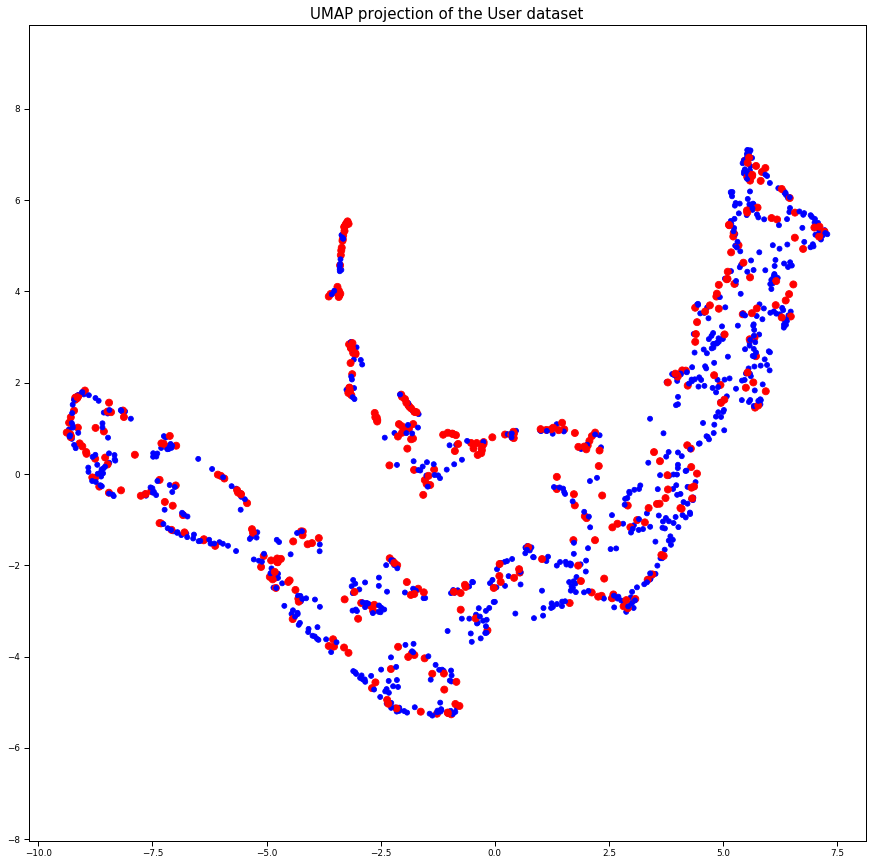

In [25]:
cols, size = plt_color(y_train)
plt.figure(figsize=(15,15))
plt.scatter(embedding[:, 0], embedding[:, 1], c=cols, s=size)
plt.gca().set_aspect('equal', 'datalim')
plt.title('UMAP projection of the User dataset', fontsize=15);

---

### UMAP enhanced clustering

In [26]:
def plot_UMAP(X_train, n_neighbors=15, min_dist=0.1, save=False):

    clusterable_embedding = umap.UMAP(
        n_neighbors=n_neighbors,
        min_dist=min_dist,
        n_components=2,
        random_state=42,
    ).fit_transform(X_train)

    cols, size = plt_color(y_train)
    plt.figure(figsize=(15, 15))
    plt.scatter(clusterable_embedding[:, 0],
                clusterable_embedding[:, 1],
                c=cols,
                s=size)
    plt.gca().set_aspect('equal', 'datalim')
    plt.title('2D UMAP Projection Mid-High-Freq- n_neighbors=' + str(n_neighbors) +
              ' - min_dist=' + str(min_dist),
              fontsize=15)
    if save:
        plt.savefig('../images/2D/UMAP-Susp_User_Dataset_Result_n_neighbors=' +
                    str(n_neighbors) + '_min_dist=' + str(min_dist)+'.png',
                    bbox_inches='tight')
    return clusterable_embedding

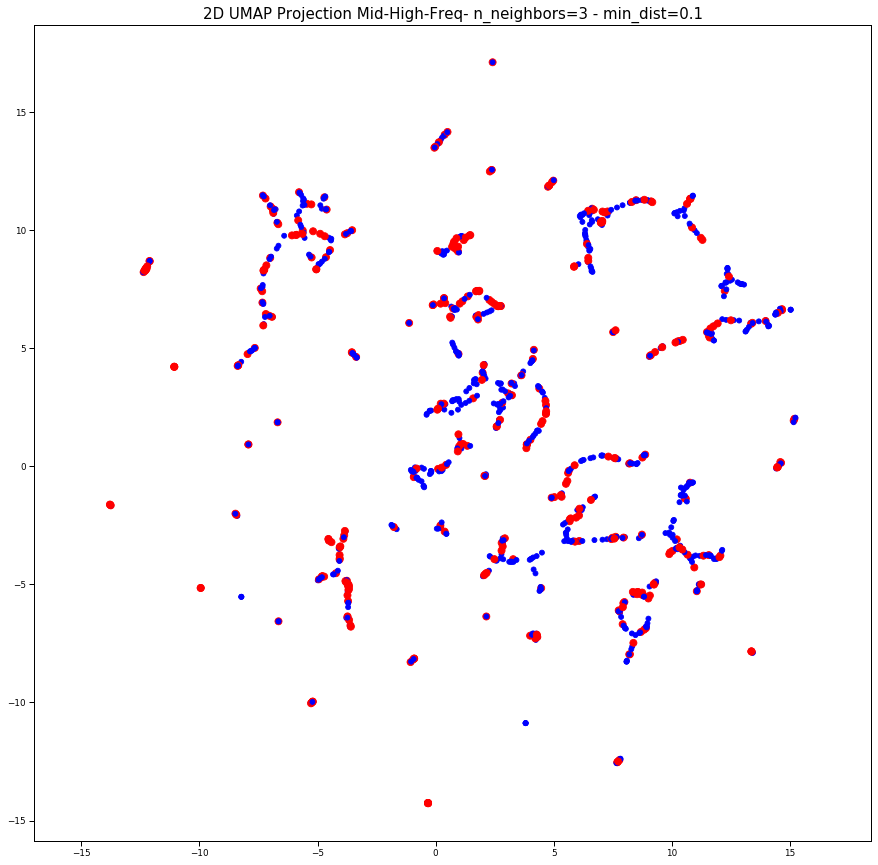

In [39]:
n_neighbors=3
min_dist=0.1
clusterable_embedding = plot_UMAP(X_train, n_neighbors, min_dist, save=False)

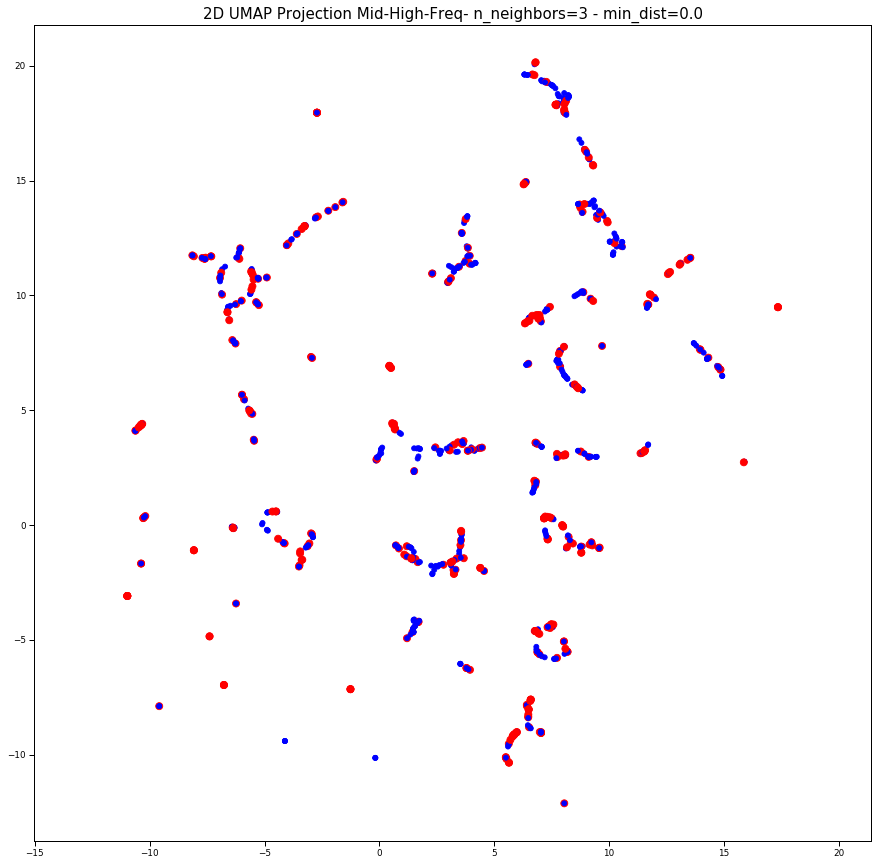

In [27]:
n_neighbors=3
min_dist=0.0
clusterable_embedding_3 = plot_UMAP(X_train, n_neighbors, min_dist, save=True)

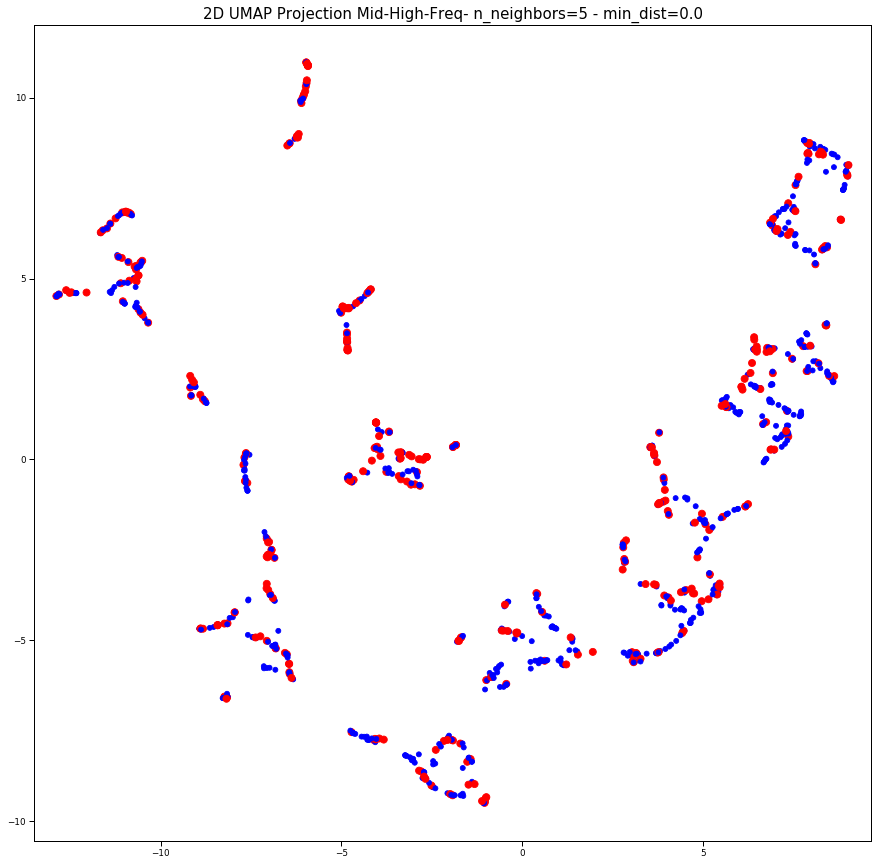

In [28]:
n_neighbors=5
min_dist=0.0
clusterable_embedding_5 = plot_UMAP(X_train, n_neighbors, min_dist, save=True)

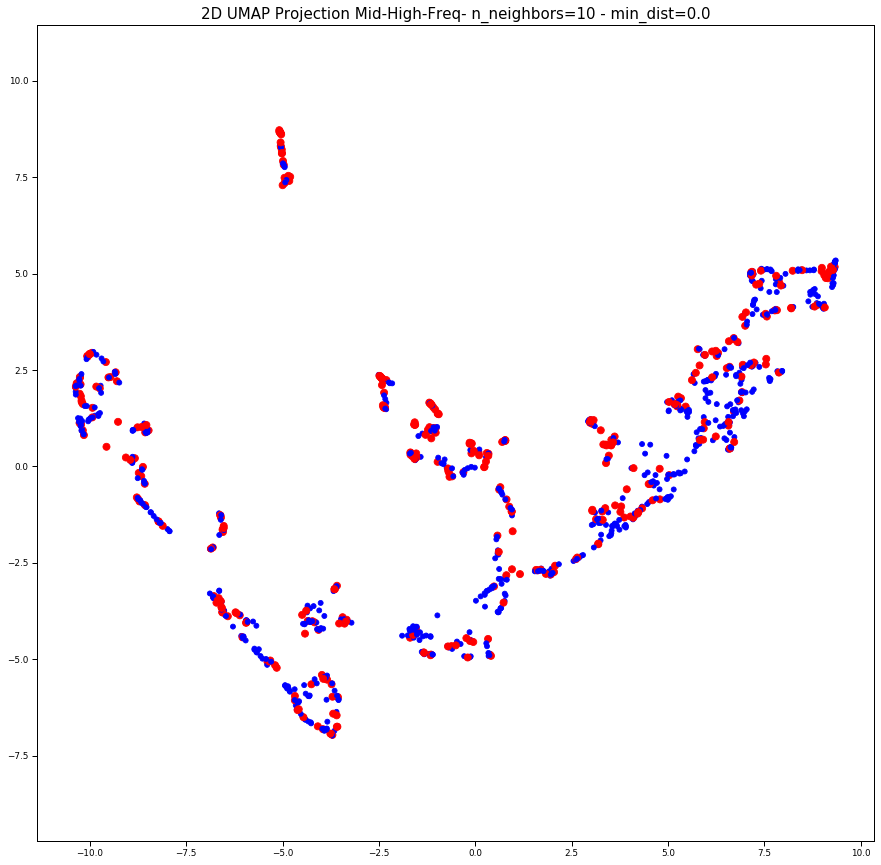

In [29]:
n_neighbors=10
min_dist=0.0
clusterable_embedding_10 = plot_UMAP(X_train, n_neighbors, min_dist, save=True)

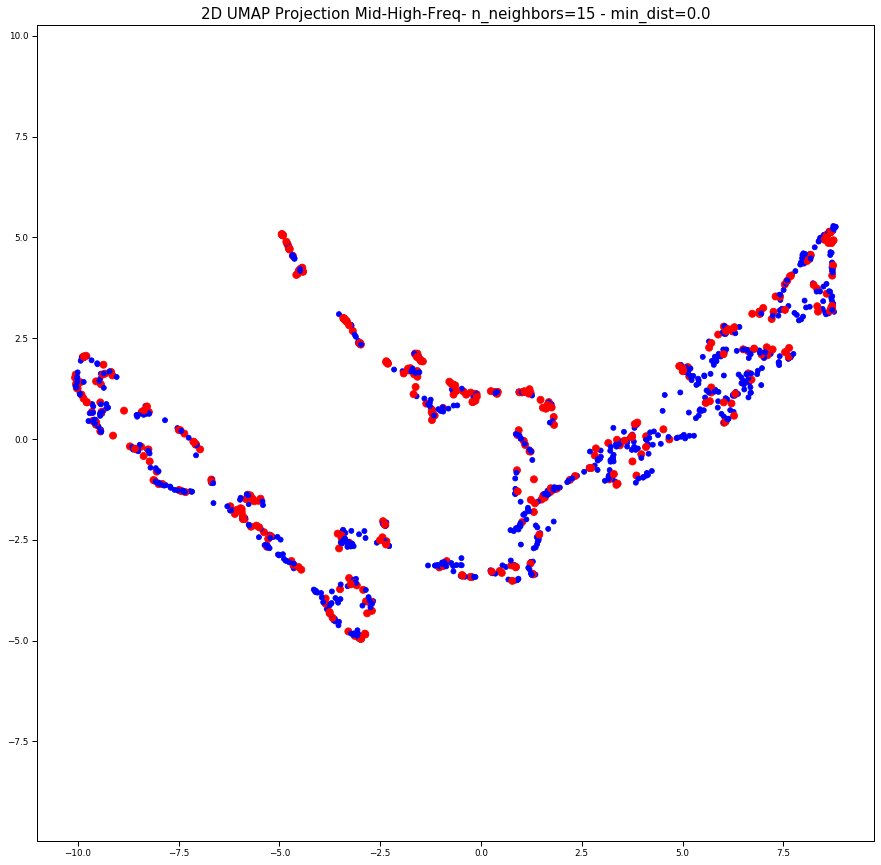

In [46]:
n_neighbors=15
min_dist=0.0
clusterable_embedding_15 = plot_UMAP(X_train, n_neighbors, min_dist, save=False)

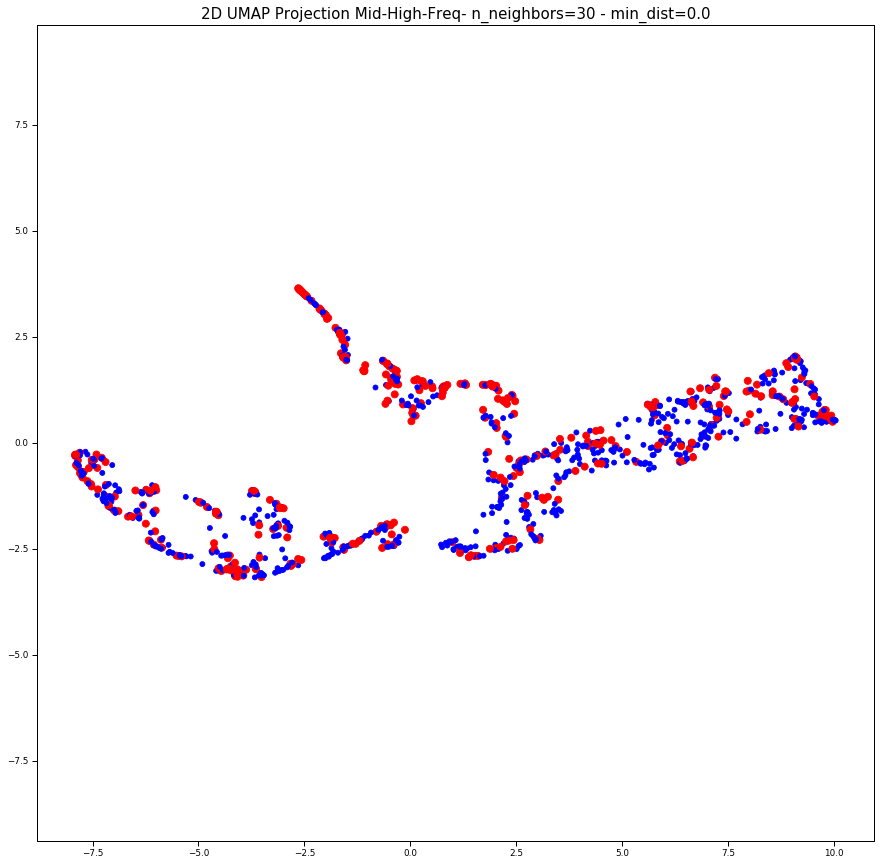

In [31]:
n_neighbors=30
min_dist=0.0
clusterable_embedding_30 = plot_UMAP(X_train, n_neighbors, min_dist, save=True)

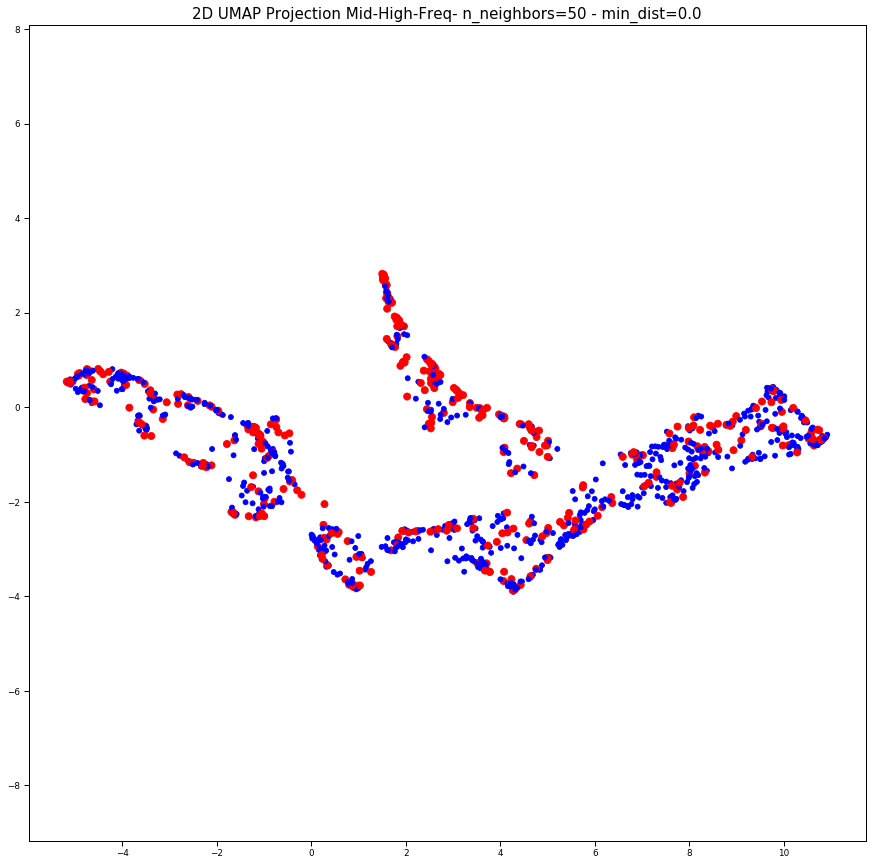

In [48]:
n_neighbors=50
min_dist=0.0
clusterable_embedding_50 = plot_UMAP(X_train, n_neighbors, min_dist, save=False)

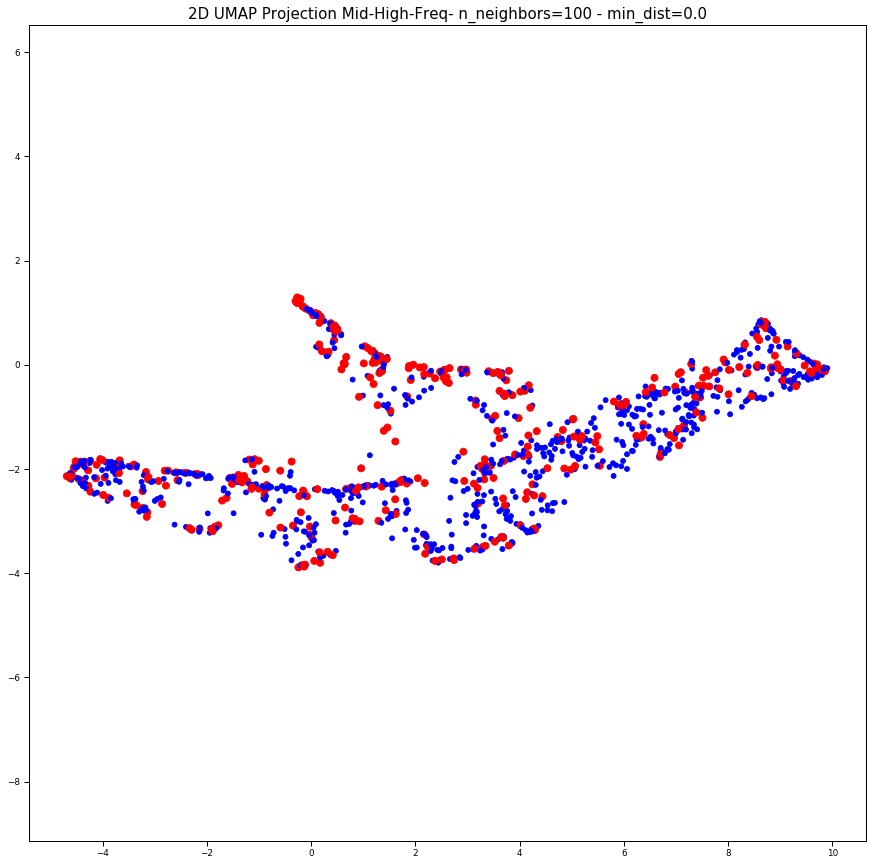

In [30]:
n_neighbors=100
min_dist=0.0
clusterable_embedding_100 = plot_UMAP(X_train, n_neighbors, min_dist, save=True)

### Creating and exploration: Dataframe with 2D data

Working with:
- n_neighbors = 5
- min_dist = 0.0

In [32]:
len(clusterable_embedding_5)

1195

In [33]:
user_df = pd.DataFrame(clusterable_embedding_5, columns=('x', 'y'))

In [34]:
user_df.head()

,x,y
0,-6,11
1,3,-3
2,-8,-1
3,-11,7
4,-3,0


In [35]:
user_df = pd.concat([data.reset_index(), user_df], axis=1)

In [36]:
user_df.head(2)

,user,default_prof_image,acc_verif,local_bol,default_profile,descr_bol,active_acc,tws_cnt,frs_cnt,fols_cnt,...,recent_age_days,user_name_len,name_len,user_name_len_num,simil_name,descr_len,fols_frs_ratio,label,x,y
0,T13,0,1,1,0,1,1,395044,111381,2837484,...,30,3,6,2,33,86,25,high_freq,-6,11
1,corrupcionchile,0,0,1,0,1,1,14235,9472,11737,...,29,15,16,0,100,98,1,high_freq,3,-3


In [37]:
def add_color_size(row): 
    if row['user'] in list_users:
        color = 'red'
        size = 10
    elif row['acc_verif']:
        color = 'yellow'
        size = 5
    else:
        color = 'blue'
        size = 3
        
    row['color'] = color
    row['size'] = size

    return row

In [45]:
def explore_Umap(user_df, list_users, title = 'UMAP projection of the User dataset'):
    user_df = user_df.apply(add_color_size, axis=1)
    datasource = ColumnDataSource(user_df)

    p = figure(title=title,
               plot_width=800,
               plot_height=800,
               tools=('crosshair, pan, wheel_zoom, reset, save, box_select'))
    p.xaxis.axis_label = 'X'
    p.yaxis.axis_label = 'Y'

    p.add_tools(
        HoverTool(tooltips=[
            ("user", "@user"),
            ("(x,y)", "($x, $y)"),
            ("acc_verif", "@acc_verif"),
            ("fols_frs_ratio", "@fols_frs_ratio"),
            ("acc_age_days", "@account_age_days")
        ]))
    
    p.circle('x',
             'y',
             source=datasource,
             color='color',
             size='size',
             fill_alpha=0.6)

    show(p)

In [165]:
list_users = []
explore_Umap(user_df, list_users)

### Verifying Simple Bots

In [39]:
list_users = ['fedoraletelier', 'Aliciacarafipl3', 'Dolores09072598']
explore_Umap(user_df, list_users)

### Verifying Top High-Frequency users

In [40]:
list_users = ['AlbertoMayol','Tomaskovacic', 'NelsonCL28']
explore_Umap(user_df, list_users)

### Verifying bot suspicius new users 

In [42]:
list_users = [
    'EncuestaExpress', 'RResponsablecl', 'cazadorandino90', 'Piagutierrezs',
    'NathalySeplved3', 'ElCentinelaMPE', 'AShumman', 'PamelaSoler3',
    'Sumate_Guillier', 'jav_ast'
]

explore_Umap(user_df, list_users)

### Verifying all susptions users

In [46]:
list_users = [
    'fedoraletelier', 'Aliciacarafipl3', 'Dolores09072598', 
    'AlbertoMayol','Tomaskovacic', 'NelsonCL28',
    'EncuestaExpress', 'RResponsablecl', 'cazadorandino90', 
    'Piagutierrezs','NathalySeplved3', 'ElCentinelaMPE', 
    'AShumman', 'PamelaSoler3','Sumate_Guillier', 'jav_ast'
]
explore_Umap(user_df, list_users,'UMAP Mid/High-Frequency Suspect Users')

## Exploring Clusters 

### Cluster 0 in detail

In [176]:
user_cluster_0 = user_df[(user_df.x > 7.7) 
                         & (user_df.x < 9.1) 
                         & (user_df.y > 8.1)
                         & (user_df.y < 8.9)]
user_cluster_0.shape

(43, 35)

In [177]:
user_cluster_0.describe().T

,count,mean,std,min,25%,50%,75%,max
default_prof_image,43,0,0,0,0,0,0,1
acc_verif,43,0,0,0,0,0,0,0
local_bol,43,0,1,0,0,0,1,1
default_profile,43,1,0,0,1,1,1,1
descr_bol,43,1,0,0,1,1,1,1
active_acc,43,1,0,0,1,1,1,1
tws_cnt,43,320,319,2,32,260,524,1209
frs_cnt,43,147,149,3,43,88,216,647
fols_cnt,43,63,85,0,12,30,79,316
fav_cnt,43,202,316,0,6,62,255,1389


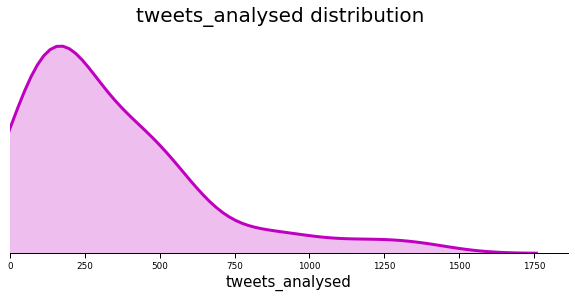

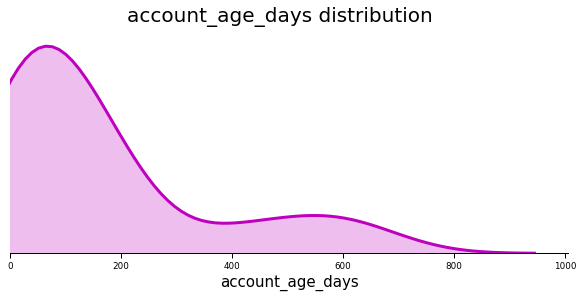

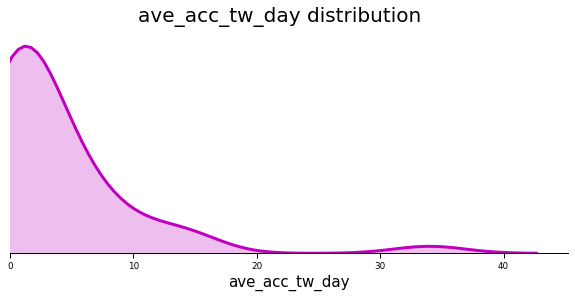

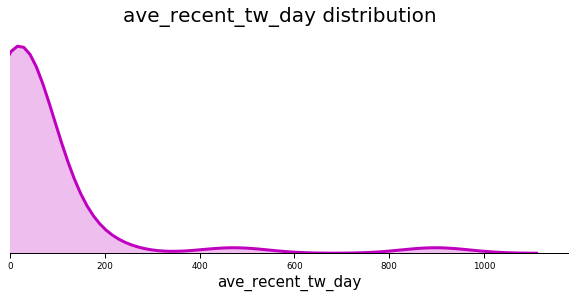

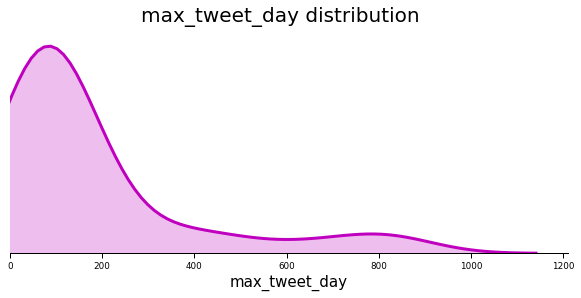

...

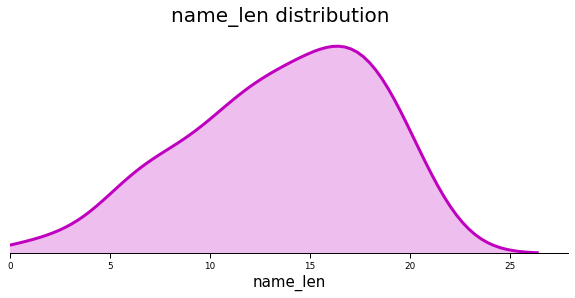

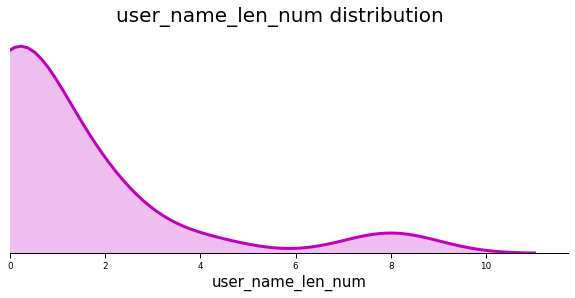

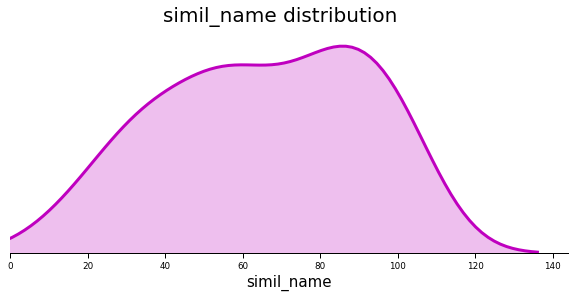

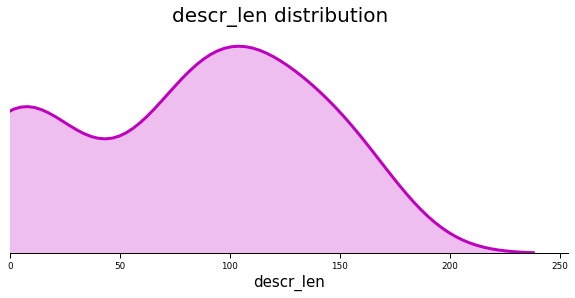

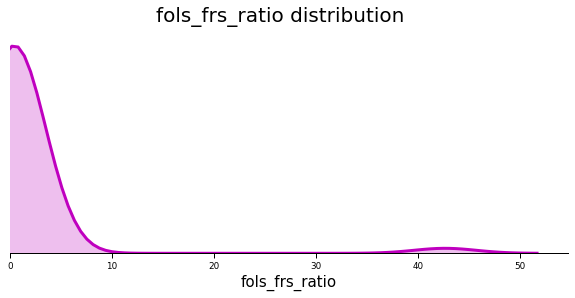

In [178]:
for feat in features:
    plot_feature(user_cluster_0, feat, prt=False, save_file_name=None)

In [181]:
users_cls_0 = list(user_cluster_0.user)
users_cls_0

['Aptimate',
 'EncuestaExpress',
 'jaimeantonio67',
 'comandoguillie4',
 'RResponsablecl',
 'mas_estudiantil',
 'arqmneira',
 'Maria_sepul66',
 'cazadorandino90',
 'DulceViborita',
 'FresiaPavez1',
 'Sirius4321',
 'viejofasho',
 'Ignacio90415476',
 'EstudioOsorno',
 'NathalySeplved3',
 'MSP_LasCondes',
 'ElCentinelaMPE',
 'caco_sanmartin',
 'maasma58',
 'Dolores09072598',
 'SoleAitkenP',
 'JuanManuelCorn5',
 'Trab_vXguillier',
 'c_alvan_0207',
 'Santiag87306226',
 'Edelarosacris',
 'andres20der',
 'mrgrtgautier',
 'BassaRiveros',
 'Conapro_jjcc',
 'SebastianFont20',
 'ChristianPolo7',
 'almquin',
 'chunchitomauro',
 'Atletadelgol32',
 'laviedej',
 'Ange_GossowF',
 'Sumate_Guillier',
 'solgensen',
 'FelipeAlegreJ',
 'BarbManriquez',
 'jav_ast']

In [186]:
list_users = users_cls_0
explore_Umap(user_df, list_users)

In [187]:
list_users = ['Choroy_Traiguen']
explore_Umap(user_df, list_users)

### Other Clusters 

<img src="UMAP-Susp_User_Dataset_Clusters.png">

In [174]:
user_cluster_1 = user_df[(user_df.x > 5) 
                         & (user_df.x < 10) 
                         & (user_df.y > 5)
                         & (user_df.y < 10)]
user_cluster_1.shape

(136, 35)

In [91]:
user_cluster_2 = user_df[(user_df.x > 5) 
                         & (user_df.x < 10) 
                         & (user_df.y > -1)
                         & (user_df.y < 5)]
user_cluster_2.shape

(182, 35)

In [96]:
user_cluster_3 = user_df[(user_df.x > 2.5) 
                         & (user_df.x < 6.4) 
                         & (user_df.y > -6)
                         & (user_df.y < 1)]
user_cluster_3.shape

(203, 35)

In [119]:
user_cluster_4 = user_df[(user_df.x > -2) 
                         & (user_df.x < 2.1) 
                         & (user_df.y > -7)
                         & (user_df.y < -3.5)]
user_cluster_4.shape

(109, 35)

In [120]:
user_cluster_5 = user_df[(user_df.x > -5) 
                         & (user_df.x < -0.5) 
                         & (user_df.y > -10)
                         & (user_df.y < -7)]
user_cluster_5.shape

(108, 35)

In [142]:
user_cluster_6 = user_df[(user_df.x > -5) 
                         & (user_df.x < -1) 
                         & (user_df.y > -1)
                         & (user_df.y < 1.2)]
user_cluster_6.shape

(90, 35)

In [145]:
user_cluster_7 = user_df[(user_df.x > -5.5) 
                         & (user_df.x < -4) 
                         & (user_df.y > 2.5)
                         & (user_df.y < 5)]
user_cluster_7.shape

(47, 35)

In [147]:
user_cluster_8 = user_df[(user_df.x > -7) 
                         & (user_df.x < -5) 
                         & (user_df.y > 8)
                         & (user_df.y < 11.2)]
user_cluster_8.shape

(44, 35)

In [149]:
user_cluster_9 = user_df[(user_df.x > -10.5) 
                         & (user_df.x < -6) 
                         & (user_df.y > -7)
                         & (user_df.y < -1.8)]
user_cluster_9.shape

(117, 35)

In [154]:
user_cluster_10= user_df[(user_df.x > -8) 
                         & (user_df.x < -7) 
                         & (user_df.y > -1)
                         & (user_df.y < 1)]
user_cluster_10.shape

(26, 35)

In [155]:
user_cluster_11 = user_df[(user_df.x > -9.5) 
                         & (user_df.x < -8.5) 
                         & (user_df.y > 1)
                         & (user_df.y < 3)]
user_cluster_11.shape

(24, 35)

In [156]:
user_cluster_12 = user_df[(user_df.x > -13) 
                         & (user_df.x < -10) 
                         & (user_df.y > 3.5)
                         & (user_df.y < 7)]
user_cluster_12.shape

(109, 35)

In [77]:
user_cluster_1.describe().T

,count,mean,std,min,25%,50%,75%,max
default_prof_image,136,0,0,0,0,0,0,1
acc_verif,136,0,0,0,0,0,0,0
local_bol,136,1,1,0,0,1,1,1
default_profile,136,1,0,0,0,1,1,1
descr_bol,136,1,0,0,1,1,1,1
active_acc,136,1,0,0,1,1,1,1
tws_cnt,136,603,553,1,152,452,933,2413
frs_cnt,136,435,569,3,71,202,558,2637
fols_cnt,136,361,522,0,31,102,446,2408
fav_cnt,136,258,319,0,29,125,397,1861


In [115]:
user_cluster_2.describe().T

,count,mean,std,min,25%,50%,75%,max
default_prof_image,182,0,0,0,0,0,0,1
acc_verif,182,0,0,0,0,0,0,0
local_bol,182,1,0,0,0,1,1,1
default_profile,182,0,1,0,0,0,1,1
descr_bol,182,1,0,0,1,1,1,1
active_acc,182,1,0,0,1,1,1,1
tws_cnt,182,4280,1956,279,2962,4142,5708,9072
frs_cnt,182,1051,1057,10,327,716,1328,5001
fols_cnt,182,1232,1239,17,236,755,1836,5534
fav_cnt,182,1665,1373,0,392,1535,2428,5292


In [116]:
user_cluster_3.describe().T

,count,mean,std,min,25%,50%,75%,max
default_prof_image,203,0,0,0,0,0,0,0
acc_verif,203,0,0,0,0,0,0,1
local_bol,203,1,0,0,0,1,1,1
default_profile,203,0,0,0,0,0,1,1
descr_bol,203,1,0,0,1,1,1,1
active_acc,203,1,0,0,1,1,1,1
tws_cnt,203,11389,5319,62,8402,11149,14904,23289
frs_cnt,203,2113,2319,17,589,1335,2569,12415
fols_cnt,203,4022,4391,88,668,2320,6144,17217
fav_cnt,203,3461,2881,4,886,2895,5593,12949


In [117]:
user_cluster_4.describe().T

,count,mean,std,min,25%,50%,75%,max
default_prof_image,109,0,0,0,0,0,0,1
acc_verif,109,0,0,0,0,0,0,1
local_bol,109,1,0,0,0,1,1,1
default_profile,109,1,1,0,0,1,1,1
descr_bol,109,1,0,0,1,1,1,1
active_acc,109,1,0,0,1,1,1,1
tws_cnt,109,17543,7147,3173,12106,18655,22739,34107
frs_cnt,109,1701,1743,53,522,1121,2085,8580
fols_cnt,109,2095,2397,191,631,1199,2433,13756
fav_cnt,109,16711,8021,6414,10645,13705,20164,44201


In [121]:
user_cluster_5.describe().T

,count,mean,std,min,25%,50%,75%,max
default_prof_image,108,0,0,0,0,0,0,1
acc_verif,108,0,0,0,0,0,0,0
local_bol,108,1,0,0,1,1,1,1
default_profile,108,0,0,0,0,0,1,1
descr_bol,108,1,0,0,1,1,1,1
active_acc,108,1,0,0,1,1,1,1
tws_cnt,108,38322,9323,24796,30576,36697,43411,61683
frs_cnt,108,2119,1575,65,1010,1853,2806,8755
fols_cnt,108,2743,2061,249,1394,2238,3300,11665
fav_cnt,108,4754,4354,0,1424,3528,7197,18362


In [143]:
user_cluster_6.describe().T

,count,mean,std,min,25%,50%,75%,max
default_prof_image,90,0,0,0,0,0,0,0
acc_verif,90,0,0,0,0,0,0,1
local_bol,90,1,0,0,1,1,1,1
default_profile,90,0,0,0,0,0,0,1
descr_bol,90,1,0,0,1,1,1,1
active_acc,90,1,0,0,1,1,1,1
tws_cnt,90,29322,21788,627,10501,25555,41019,85983
frs_cnt,90,10043,14704,7,964,3774,12937,70858
fols_cnt,90,34474,17667,10141,21106,29216,44640,99510
fav_cnt,90,5934,11053,4,440,1965,5909,67507


In [146]:
user_cluster_7.describe().T

,count,mean,std,min,25%,50%,75%,max
default_prof_image,47,0,0,0,0,0,0,0
acc_verif,47,0,1,0,0,0,1,1
local_bol,47,1,0,0,1,1,1,1
default_profile,47,0,0,0,0,0,0,1
descr_bol,47,1,0,0,1,1,1,1
active_acc,47,1,0,0,1,1,1,1
tws_cnt,47,43751,41461,2385,13613,23536,71868,147926
frs_cnt,47,13299,36635,71,1016,2154,5386,199334
fols_cnt,47,122413,43949,60452,82908,121779,150939,209585
fav_cnt,47,8528,17553,2,372,2982,7226,97445


In [157]:
user_cluster_8.describe().T

,count,mean,std,min,25%,50%,75%,max
default_prof_image,44,0,0,0,0,0,0,0
acc_verif,44,1,1,0,0,1,1,1
local_bol,44,1,0,0,1,1,1,1
default_profile,44,0,0,0,0,0,0,1
descr_bol,44,1,0,0,1,1,1,1
active_acc,44,1,0,0,1,1,1,1
tws_cnt,44,141057,171231,1099,31507,80592,169034,776354
frs_cnt,44,66931,153312,0,1260,4347,37464,761106
fols_cnt,44,890175,751869,205533,311358,557119,1207956,2882527
fav_cnt,44,14645,48913,9,150,966,5122,279225


In [151]:
user_cluster_9.describe().T

,count,mean,std,min,25%,50%,75%,max
default_prof_image,117,0,0,0,0,0,0,0
acc_verif,117,0,0,0,0,0,0,1
local_bol,117,1,0,0,1,1,1,1
default_profile,117,0,0,0,0,0,1,1
descr_bol,117,1,0,0,1,1,1,1
active_acc,117,1,0,0,1,1,1,1
tws_cnt,117,57862,13894,26541,44681,59596,68633,83283
frs_cnt,117,3437,3295,119,1088,2584,4912,17980
fols_cnt,117,5170,4650,232,1748,3415,6778,21572
fav_cnt,117,25430,19604,41,9884,21912,36147,99369


In [158]:
user_cluster_10.describe().T

,count,mean,std,min,25%,50%,75%,max
default_prof_image,26,0,0,0,0,0,0,0
acc_verif,26,0,0,0,0,0,0,0
local_bol,26,1,0,0,1,1,1,1
default_profile,26,0,0,0,0,0,1,1
descr_bol,26,1,0,0,1,1,1,1
active_acc,26,1,0,0,1,1,1,1
tws_cnt,26,94627,10499,79549,85458,93580,103088,114338
frs_cnt,26,3830,3686,343,1358,2522,4939,15638
fols_cnt,26,6078,5018,973,2671,4644,8252,21185
fav_cnt,26,4090,3005,19,1444,3724,6538,8878


In [159]:
user_cluster_11.describe().T

,count,mean,std,min,25%,50%,75%,max
default_prof_image,24,0,0,0,0,0,0,0
acc_verif,24,0,0,0,0,0,0,0
local_bol,24,1,0,0,1,1,1,1
default_profile,24,0,0,0,0,0,0,1
descr_bol,24,1,0,1,1,1,1,1
active_acc,24,1,0,0,1,1,1,1
tws_cnt,24,110083,12403,89309,98731,113365,120726,127119
frs_cnt,24,4922,5310,376,2021,3444,5133,25511
fols_cnt,24,7976,7421,1682,3361,4036,11879,32219
fav_cnt,24,26464,9964,11364,18249,24330,34925,44002


In [160]:
user_cluster_12.describe().T

,count,mean,std,min,25%,50%,75%,max
default_prof_image,109,0,0,0,0,0,0,1
acc_verif,109,0,0,0,0,0,0,1
local_bol,109,1,0,0,1,1,1,1
default_profile,109,0,0,0,0,0,0,1
descr_bol,109,1,0,0,1,1,1,1
active_acc,109,1,0,0,1,1,1,1
tws_cnt,109,200394,110310,61342,141520,168493,220817,888346
frs_cnt,109,5705,7582,7,1287,3343,7459,61275
fols_cnt,109,13380,16559,284,3897,8392,15349,83505
fav_cnt,109,45833,57478,1,3627,23705,64873,303133


In [110]:
features = ['tweets_analysed', 'account_age_days',
       'ave_acc_tw_day', 'ave_recent_tw_day', 'max_tweet_day',
       'ment_tweets_cnt', 'hash_tweets_cnt', 'unique_mentions_cnt',
       'unique_hashtags_cnt', 'ment_idx', 'hash_idx', 'rt_ratio', 'mean_urls',
       'mean_lenght', 'recent_age_days', 'user_name_len', 'name_len',
       'user_name_len_num', 'simil_name', 'descr_len', 'fols_frs_ratio']

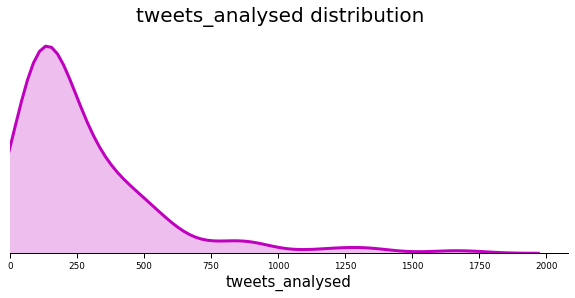

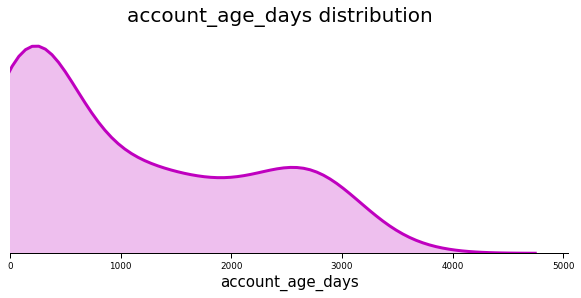

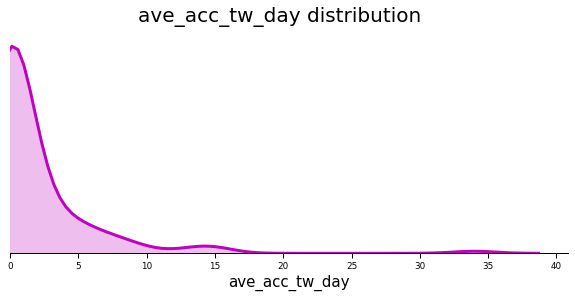

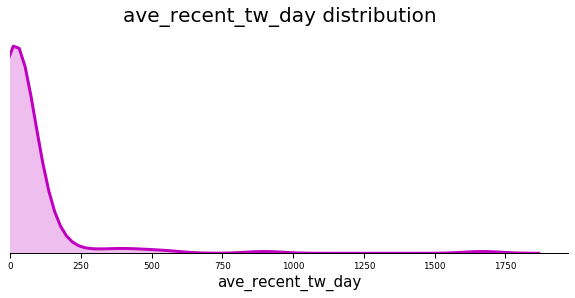

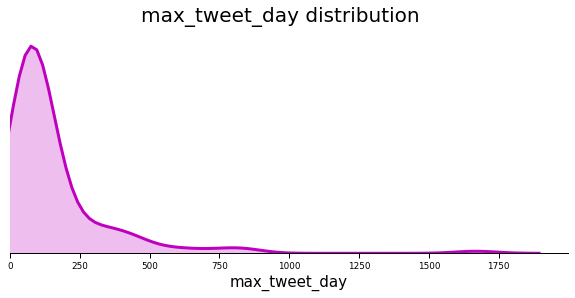

...

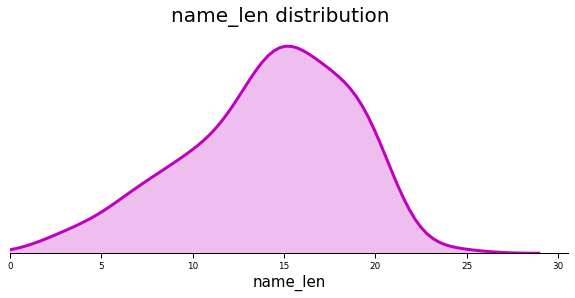

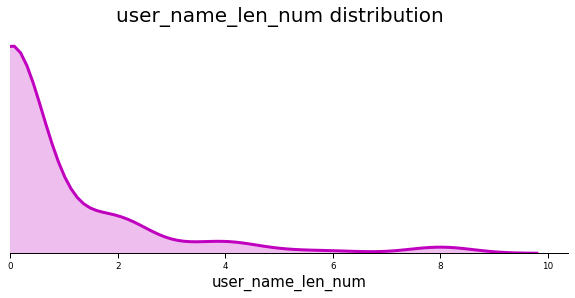

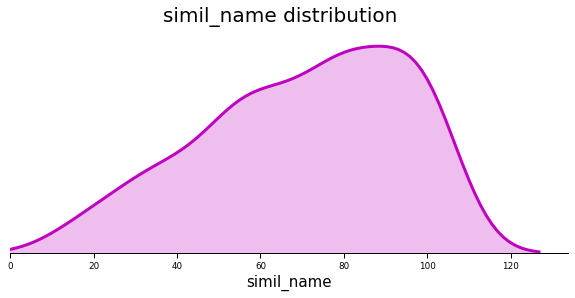

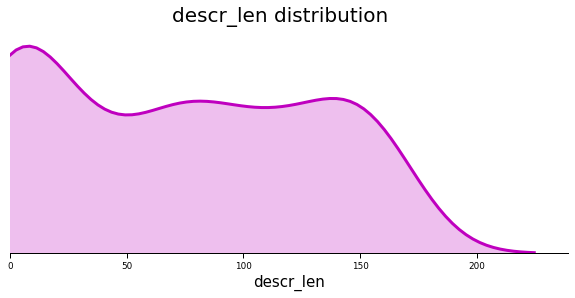

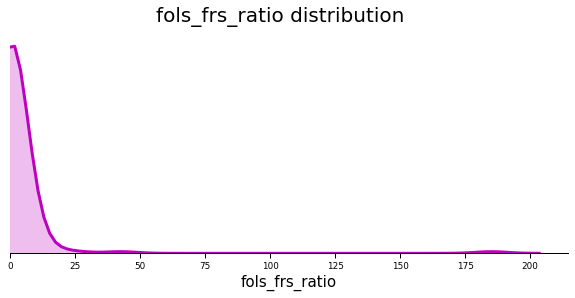

In [89]:
for feat in features:
    plot_feature(user_cluster_1, feat, prt=False, save_file_name=None)

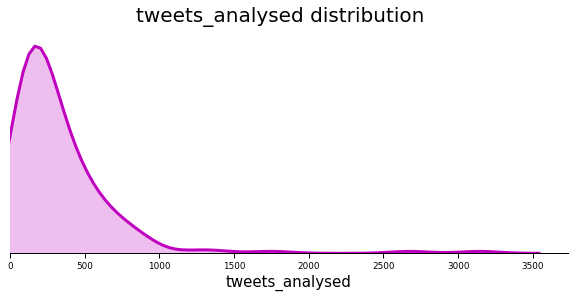

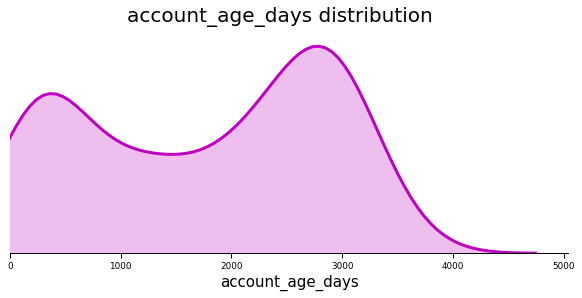

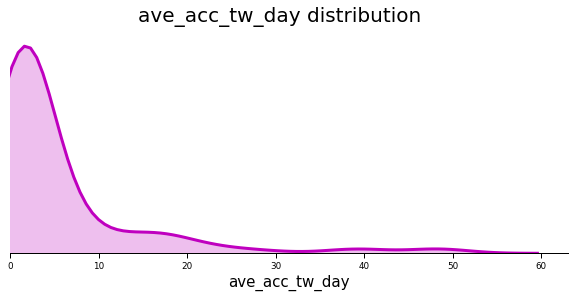

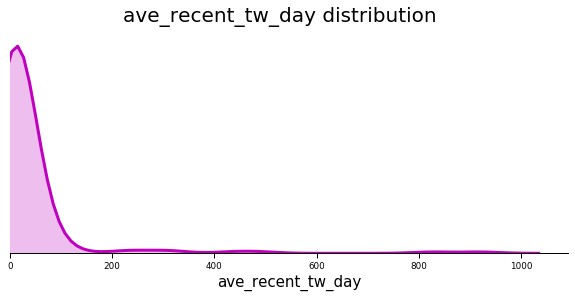

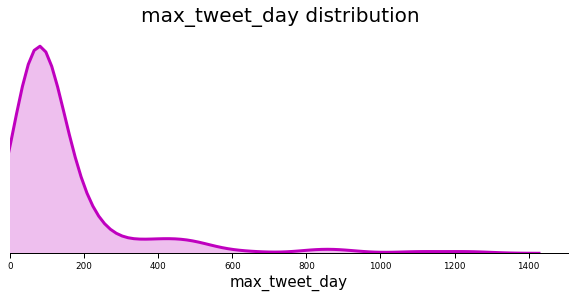

...

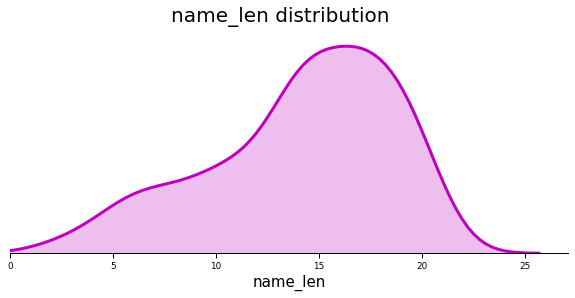

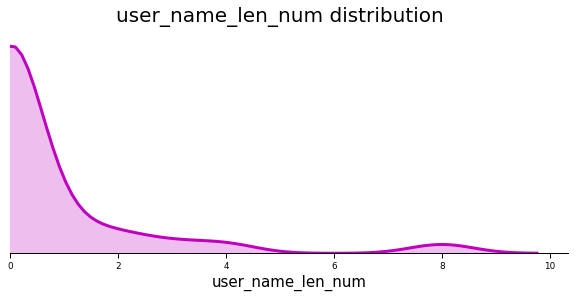

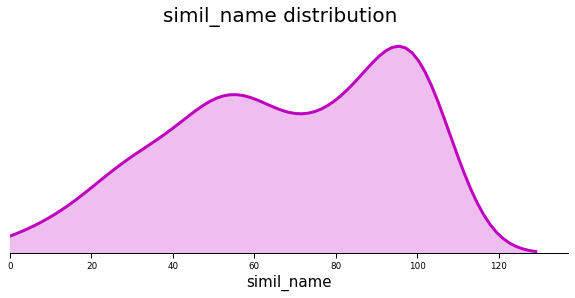

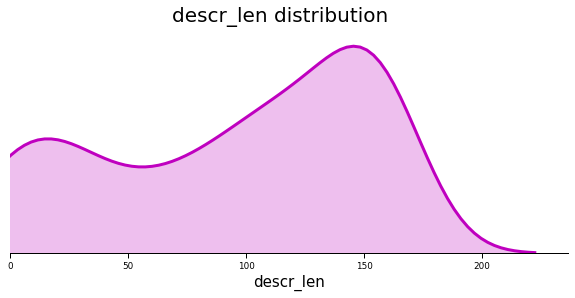

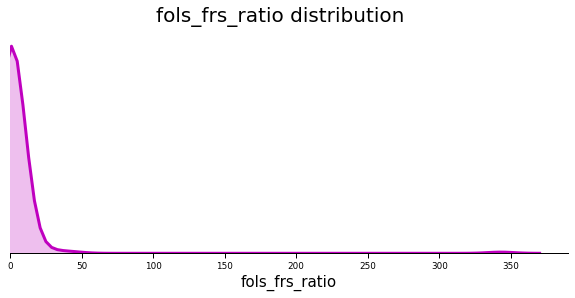

In [92]:
for feat in features:
    plot_feature(user_cluster_2, feat, prt=False, save_file_name=None)

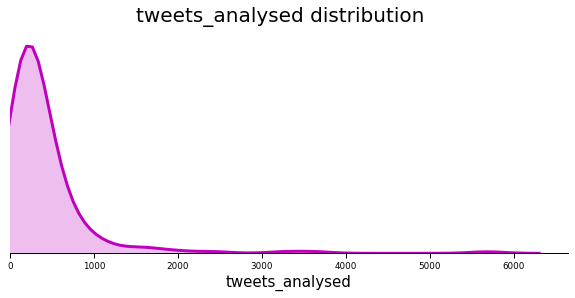

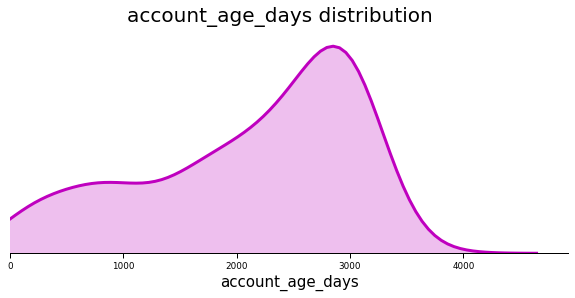

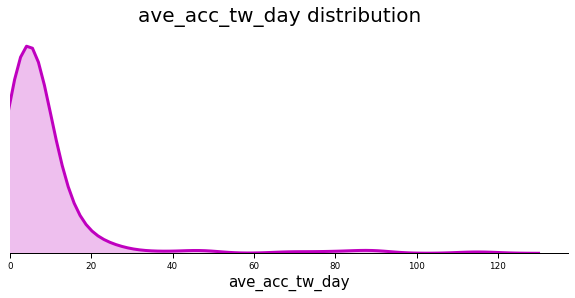

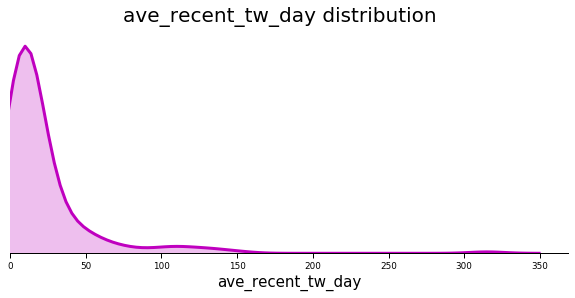

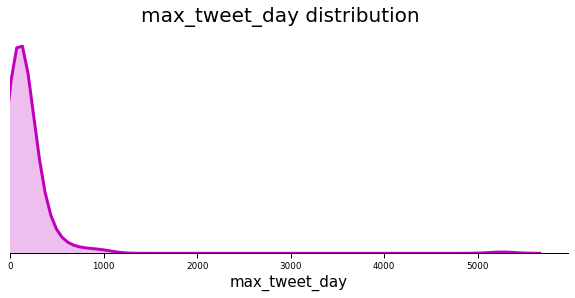

...

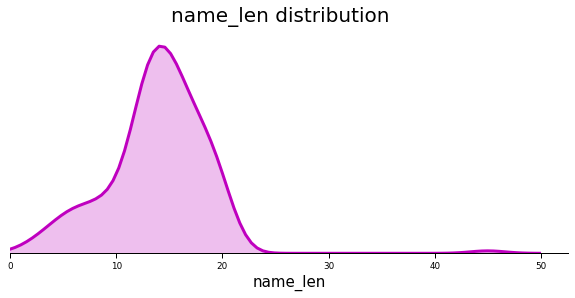

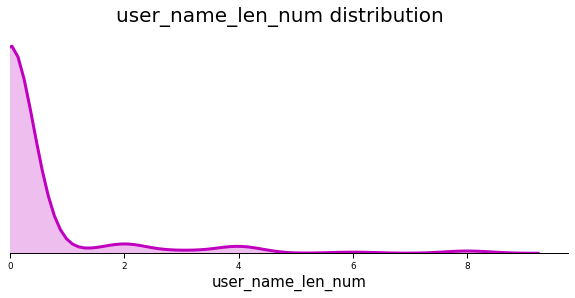

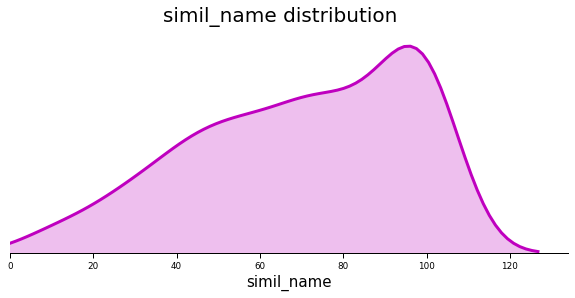

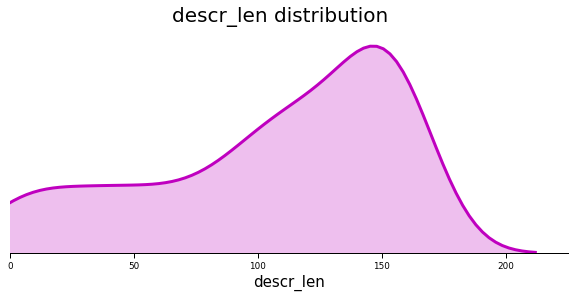

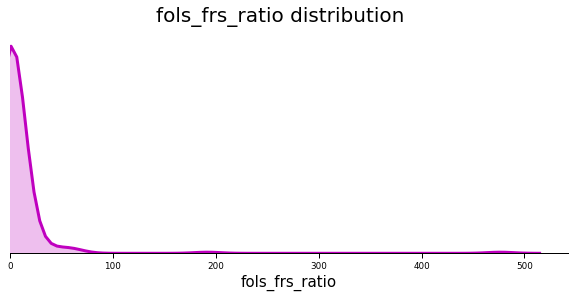

In [97]:
for feat in features:
    plot_feature(user_cluster_3, feat, prt=False, save_file_name=None)

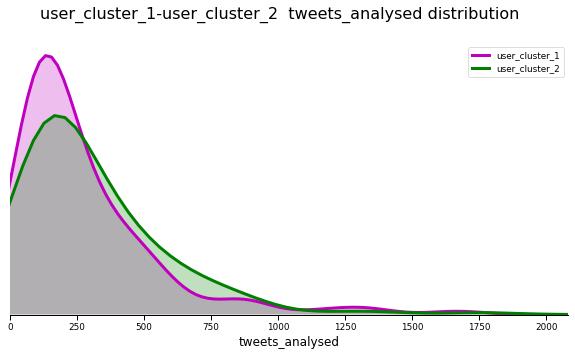

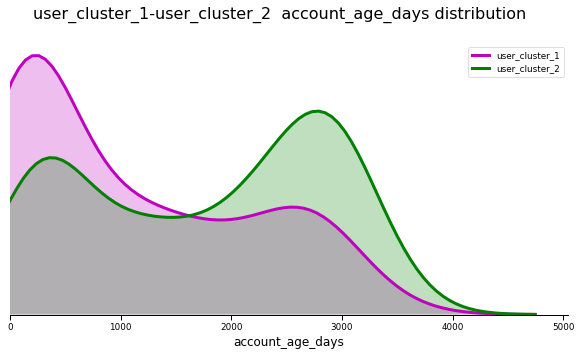

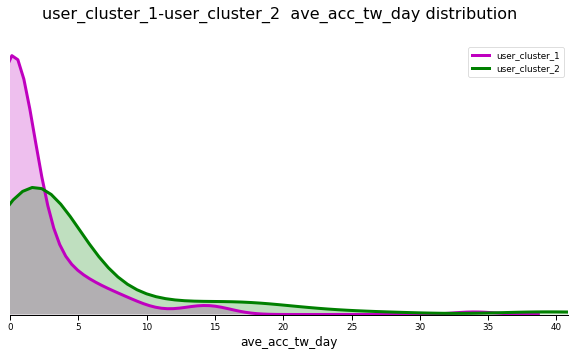

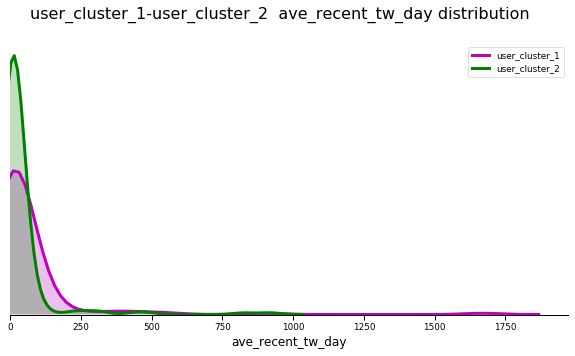

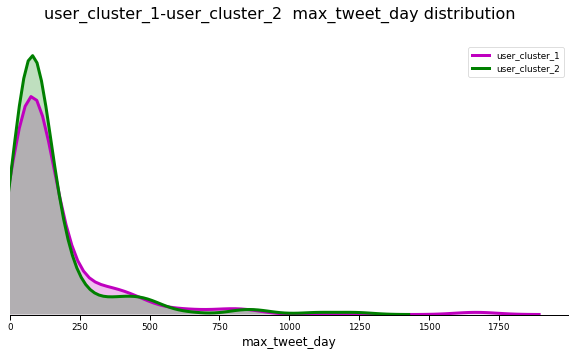

...

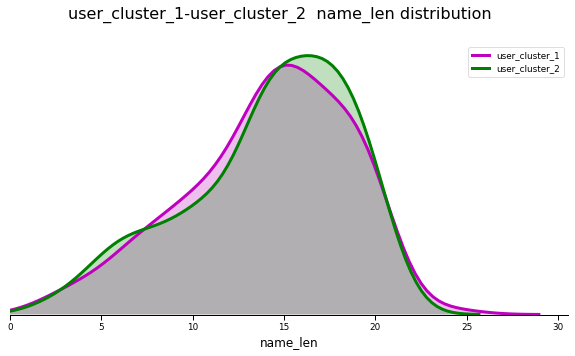

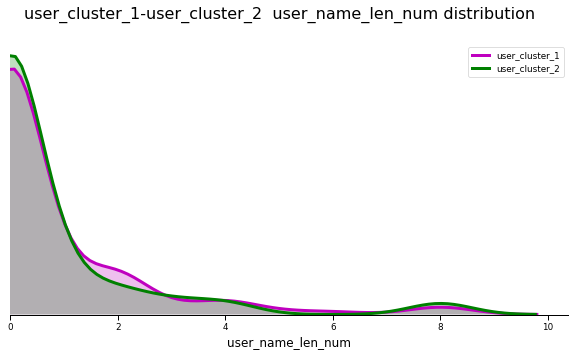

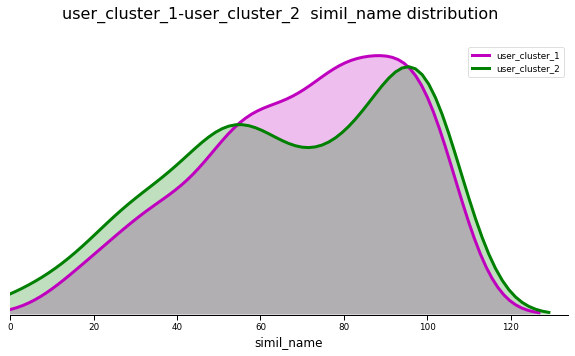

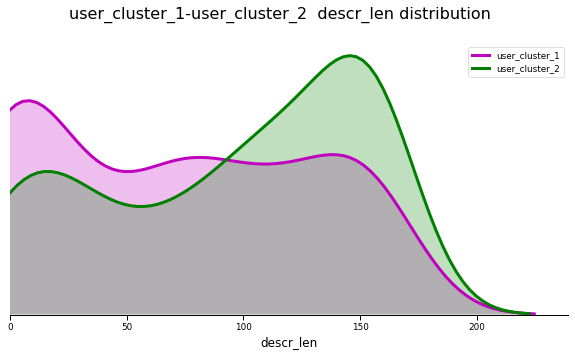

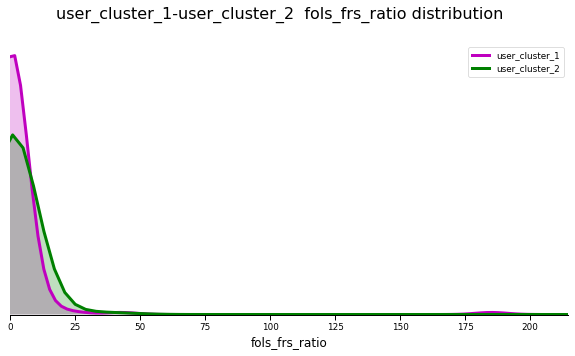

In [111]:
for feat in features:
    plot_feat_comp(user_cluster_1, user_cluster_2, feat, prt=False)

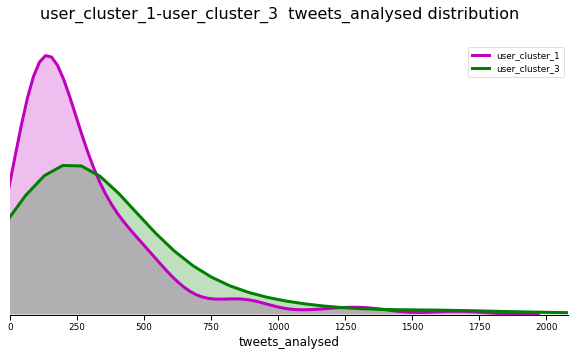

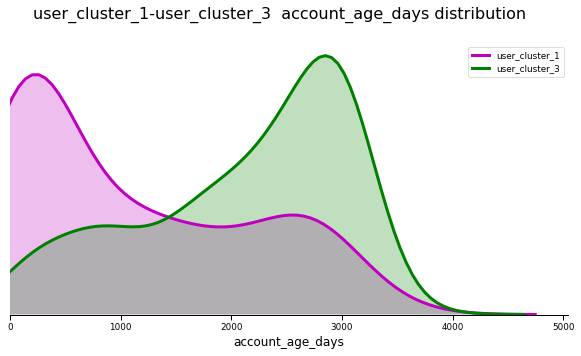

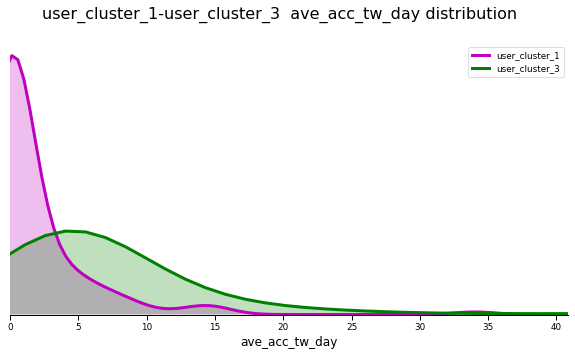

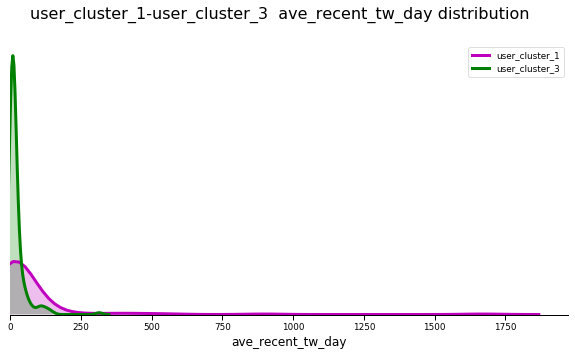

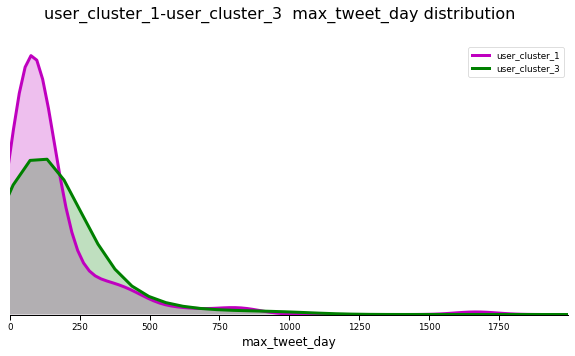

...

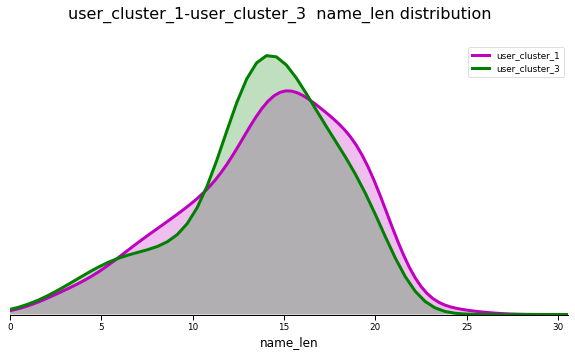

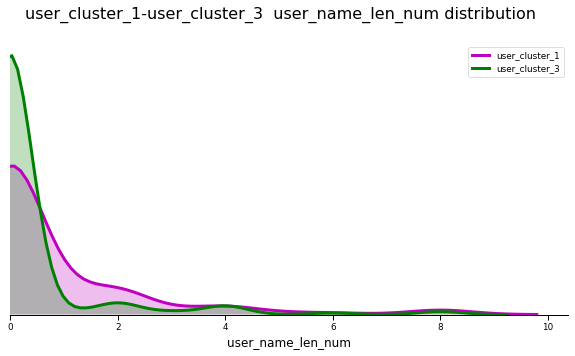

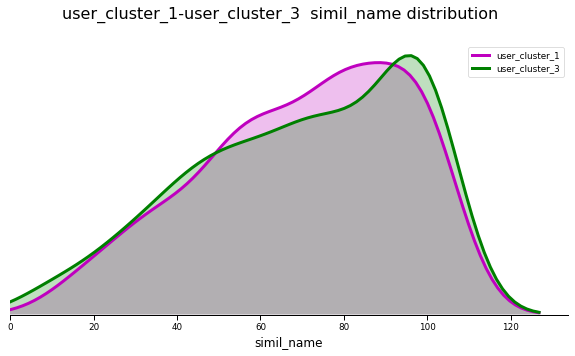

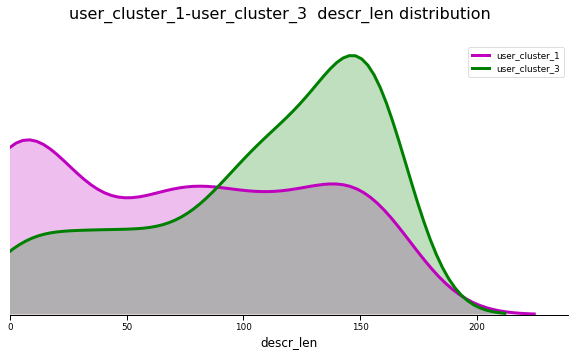

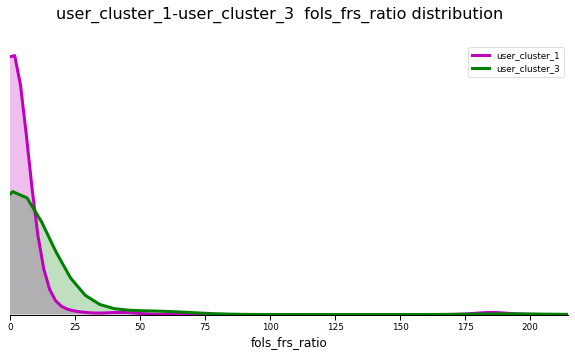

In [112]:
for feat in features:
    plot_feat_comp(user_cluster_1, user_cluster_3, feat, prt=False)

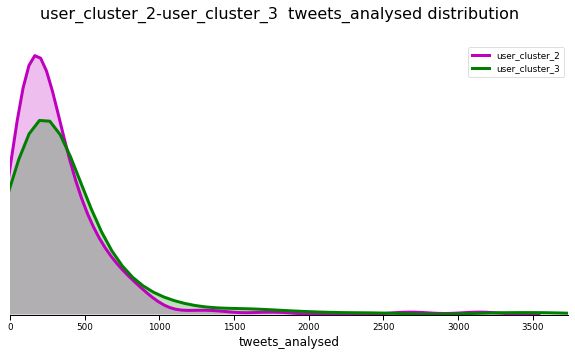

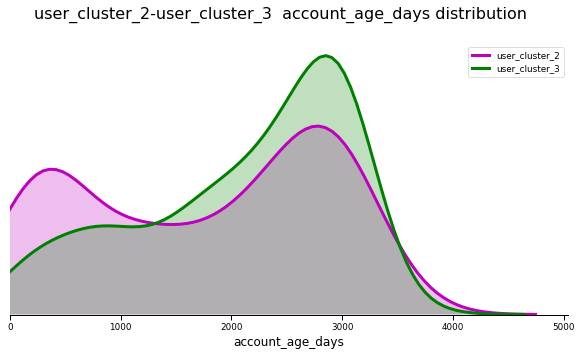

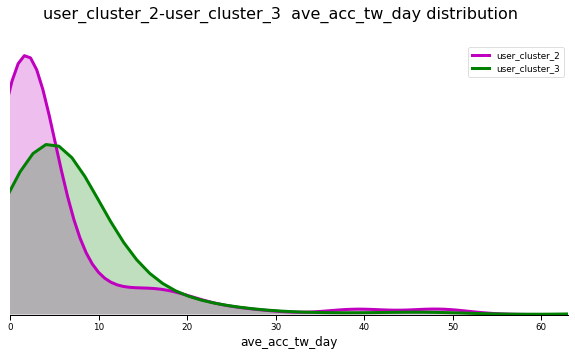

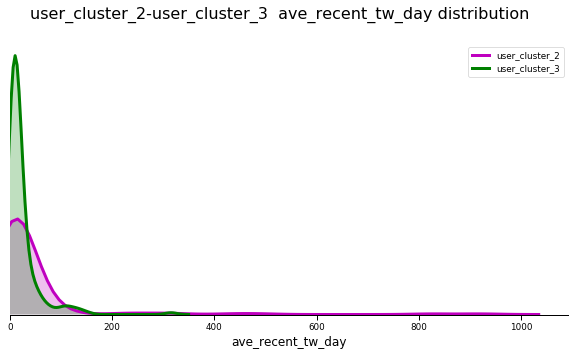

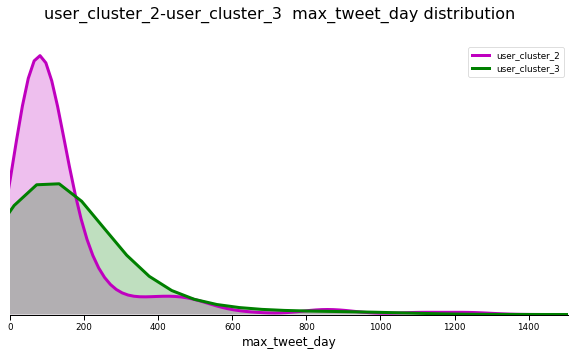

...

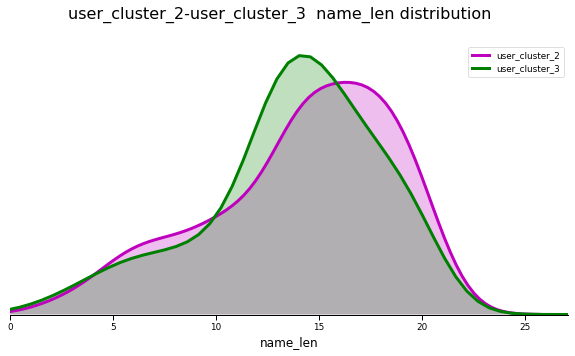

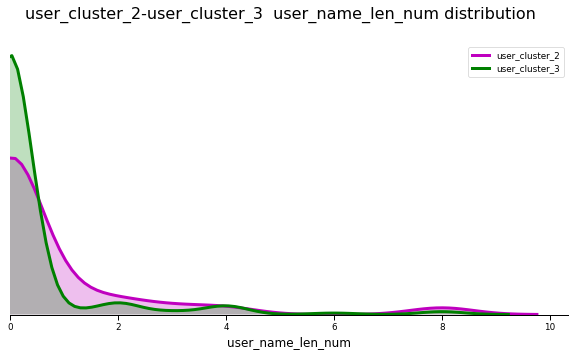

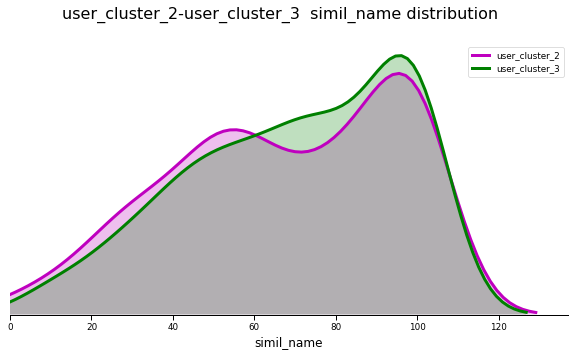

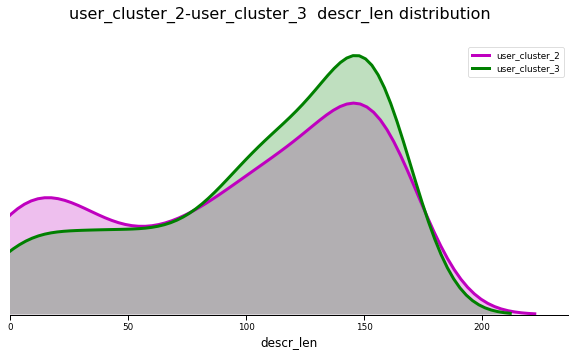

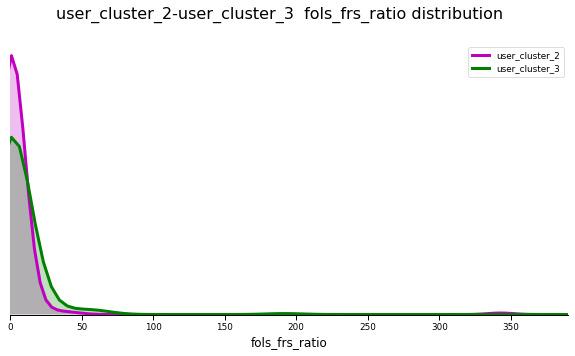

In [113]:
for feat in features:
    plot_feat_comp(user_cluster_2, user_cluster_3, feat, prt=False)

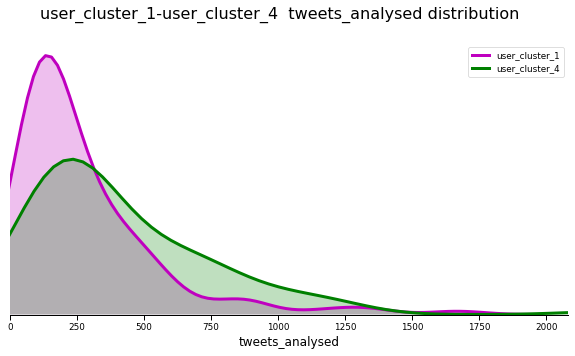

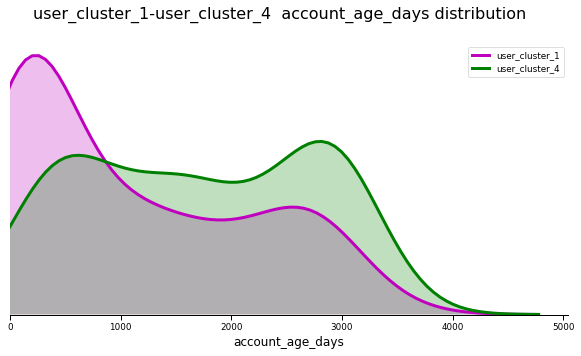

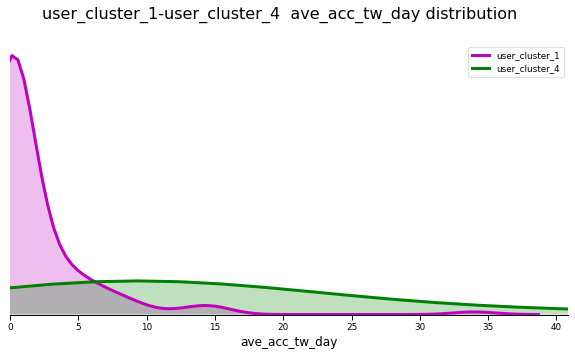

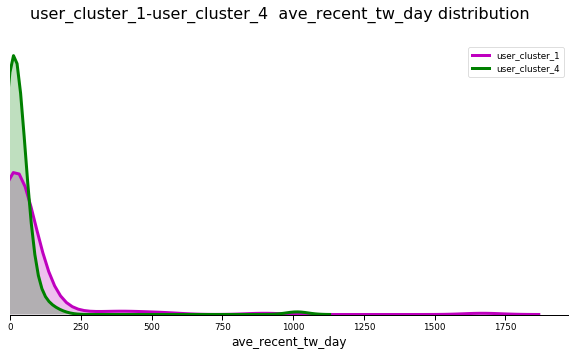

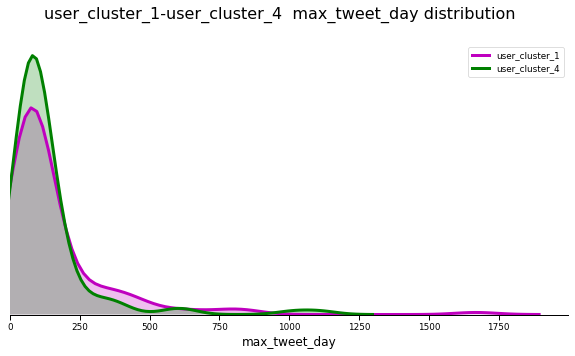

...

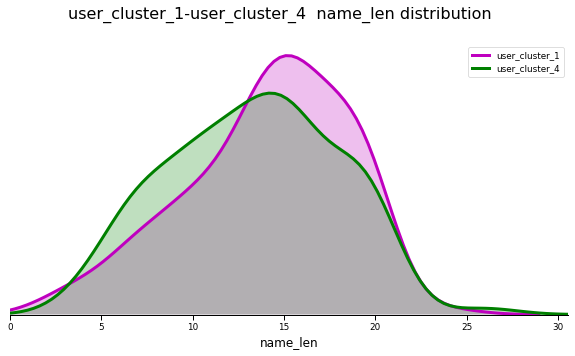

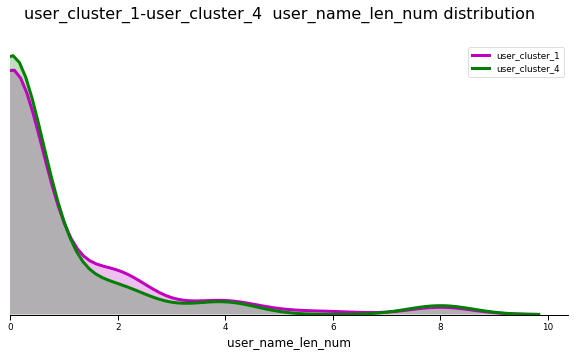

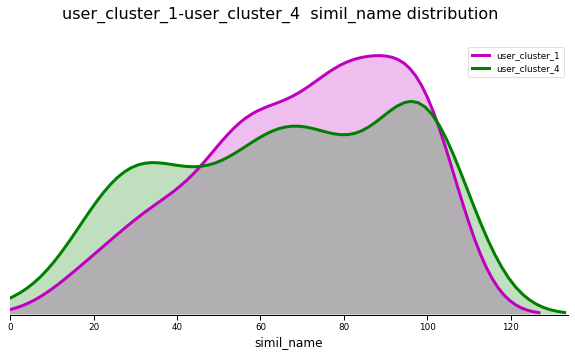

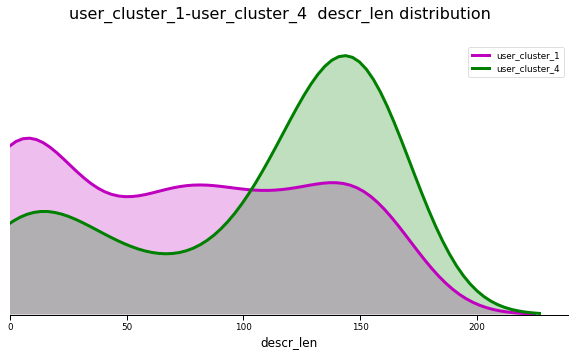

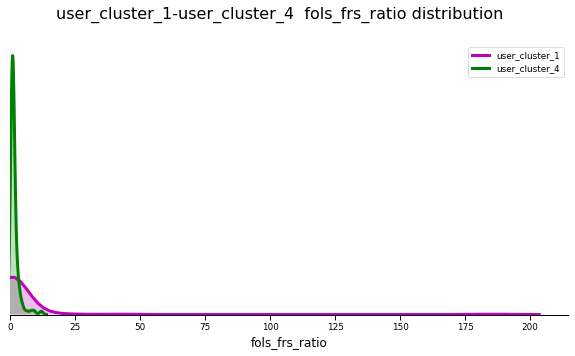

In [114]:
for feat in features:
    plot_feat_comp(user_cluster_1, user_cluster_4, feat, prt=False)

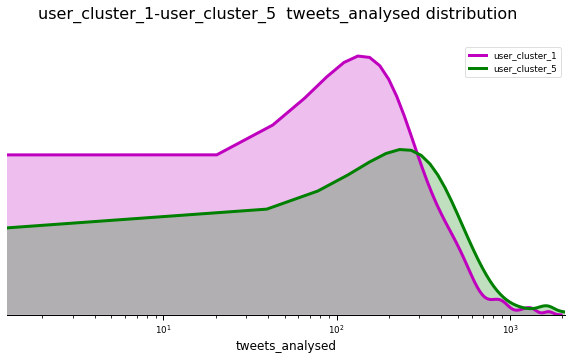

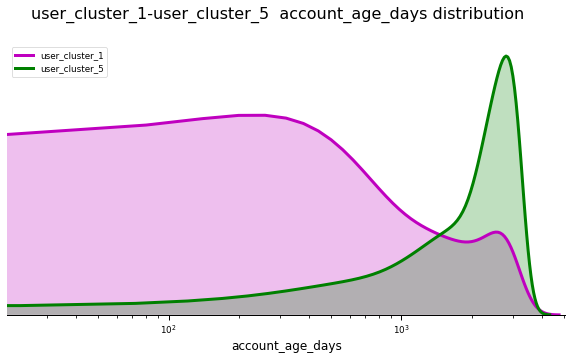

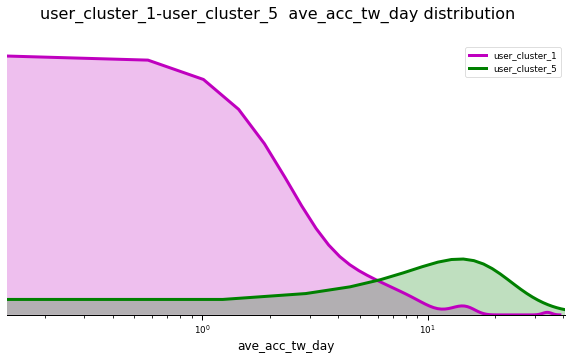

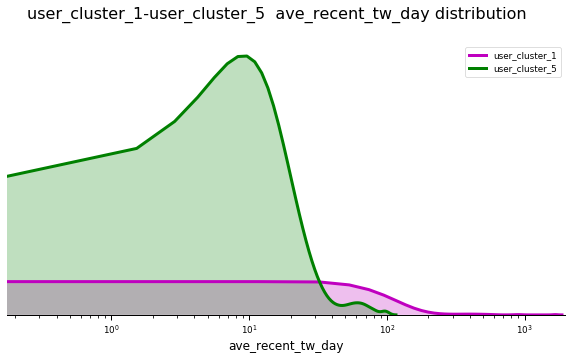

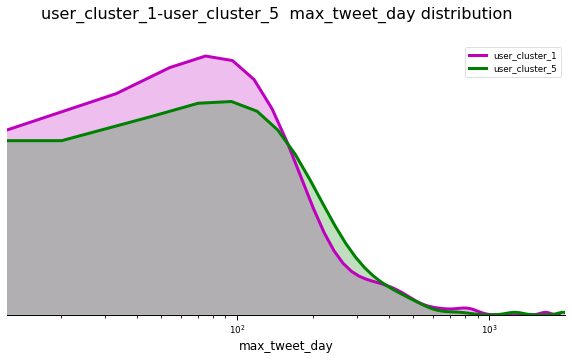

...

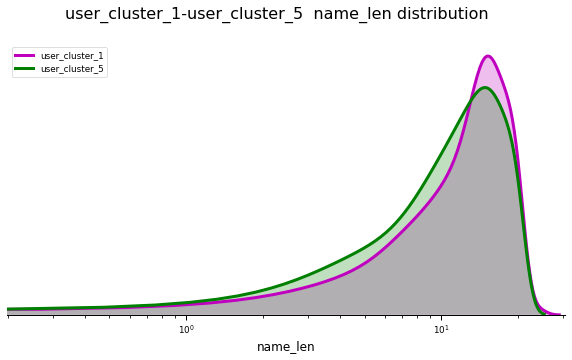

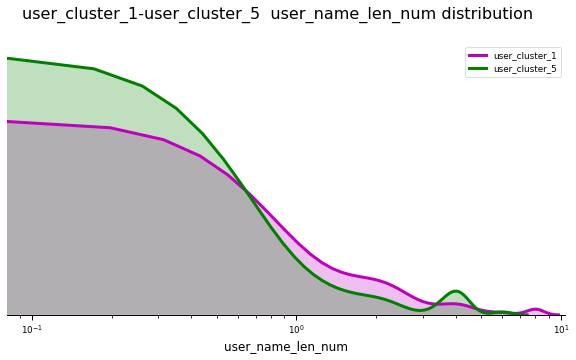

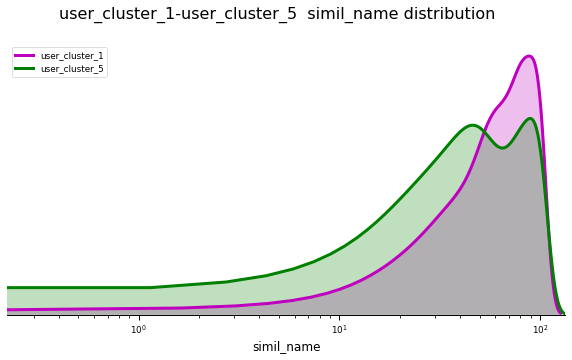

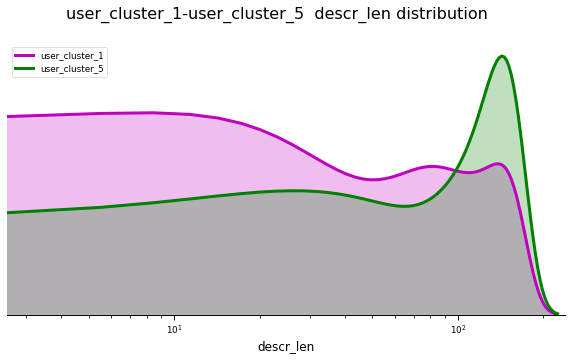

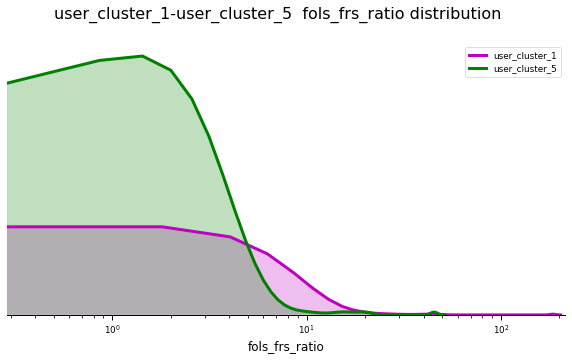

In [134]:
for feat in features:
    plot_feat_comp(user_cluster_1, user_cluster_5, feat, prt=False, log=True)

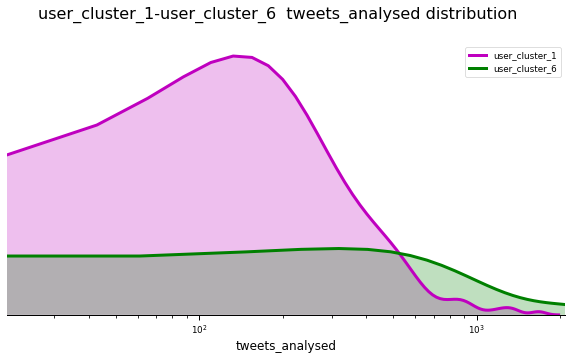

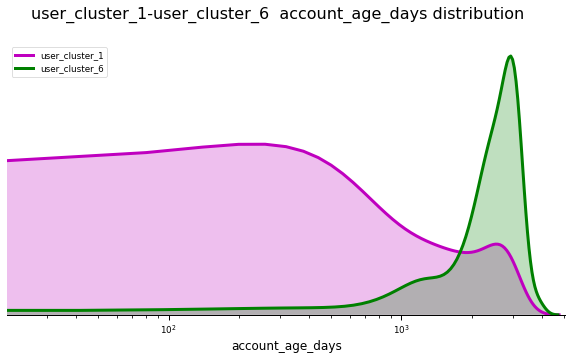

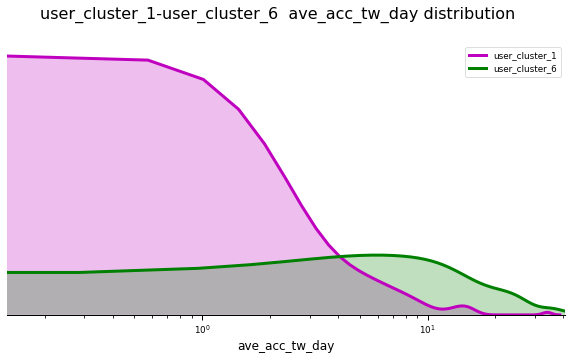

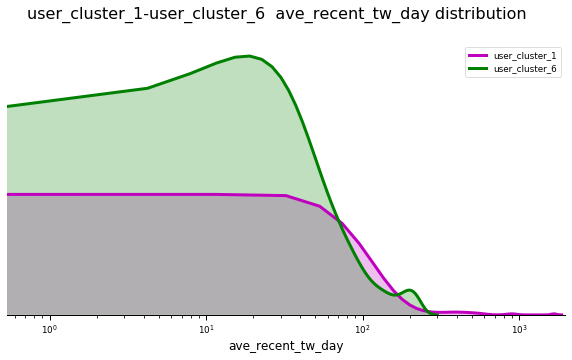

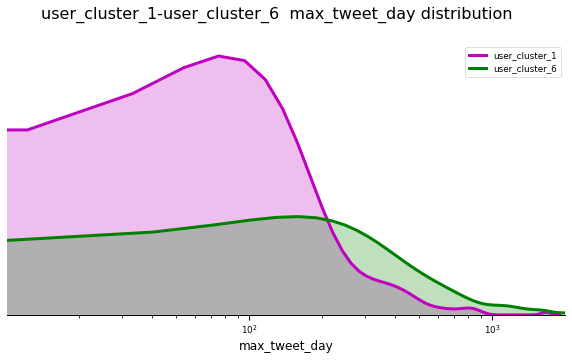

...

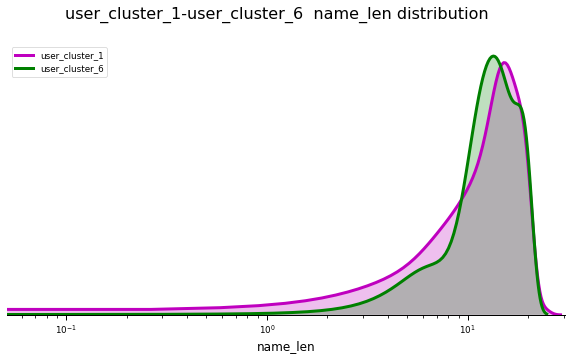

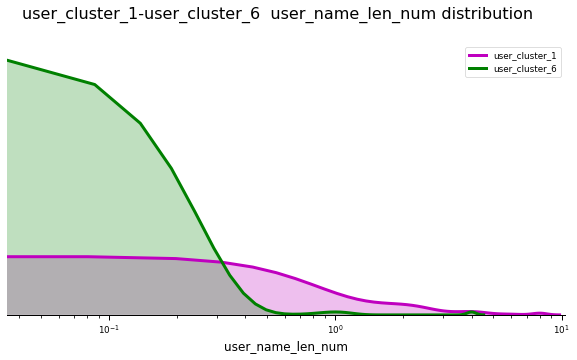

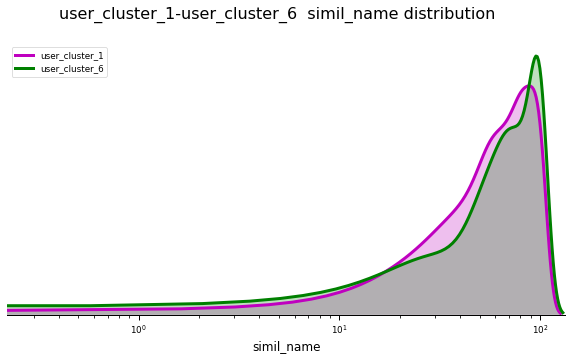

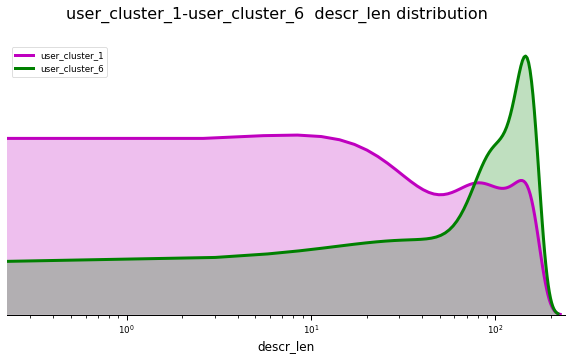

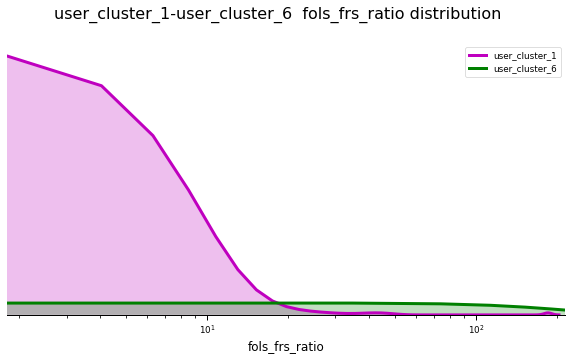

In [144]:
for feat in features:
    plot_feat_comp(user_cluster_1, user_cluster_6, feat, prt=False, log=True)

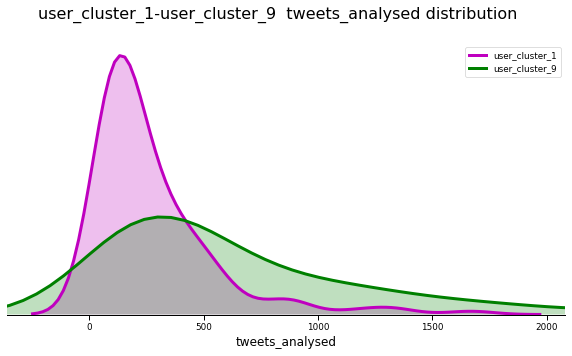

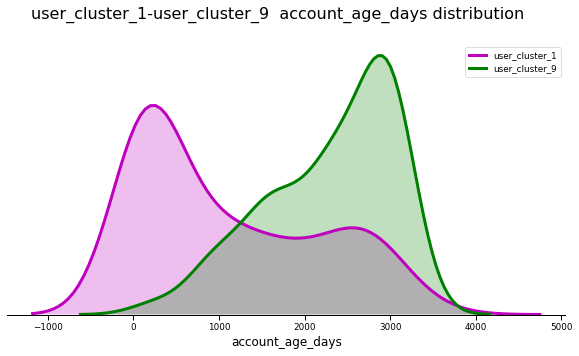

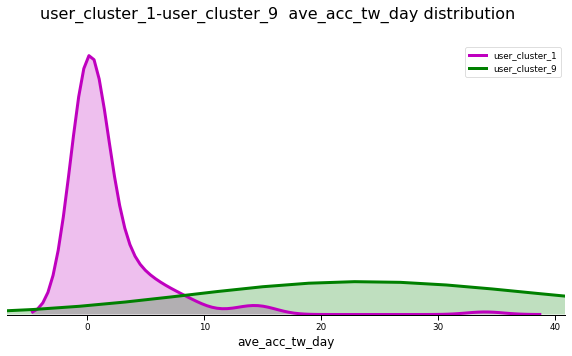

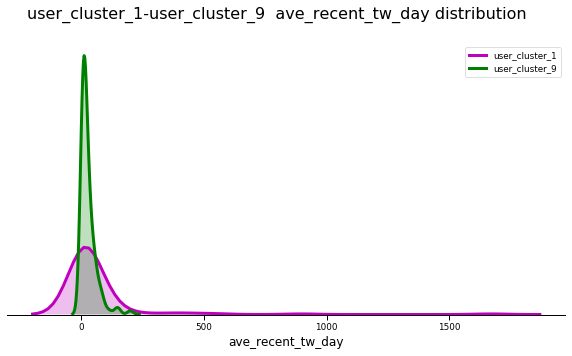

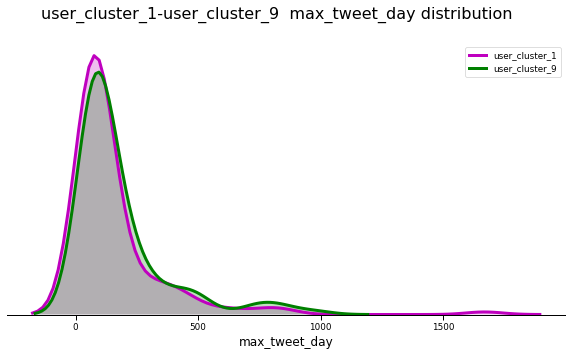

...

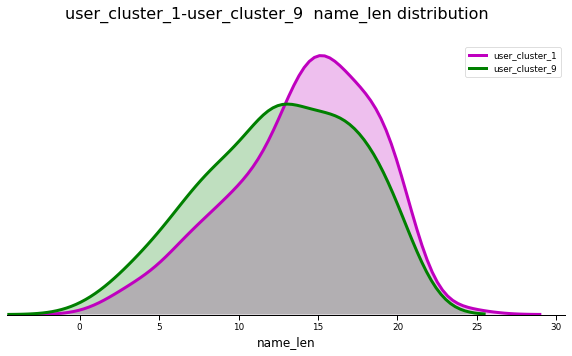

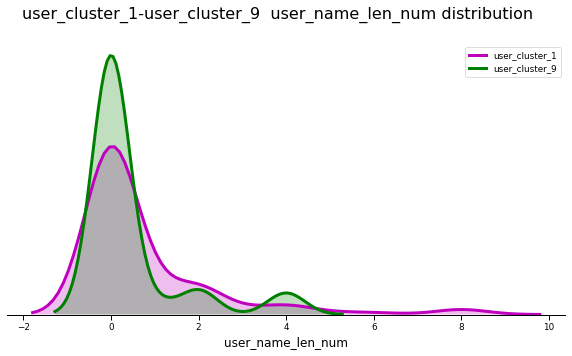

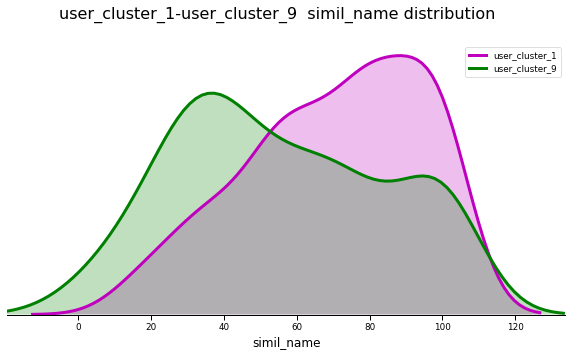

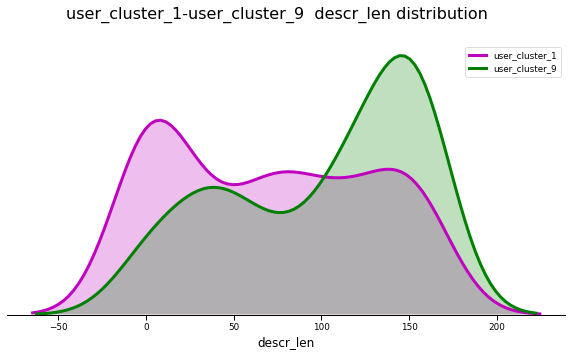

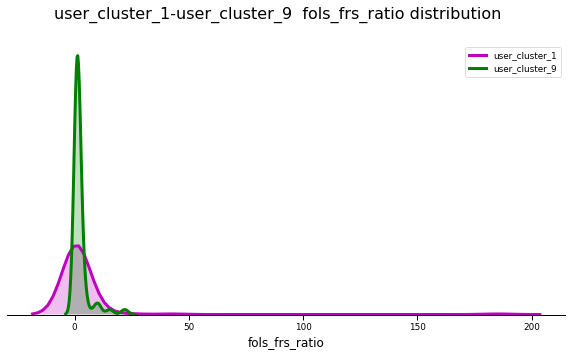

In [152]:
for feat in features:
    plot_feat_comp(user_cluster_1, user_cluster_9, feat, prt=False, log=False)

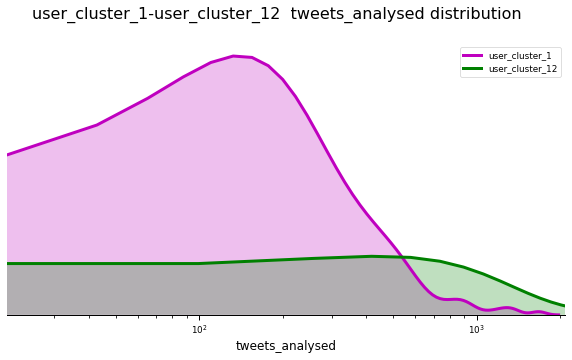

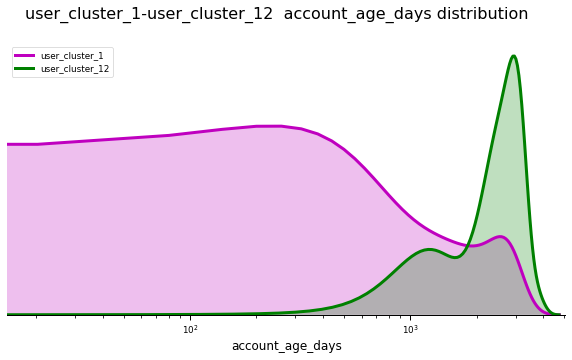

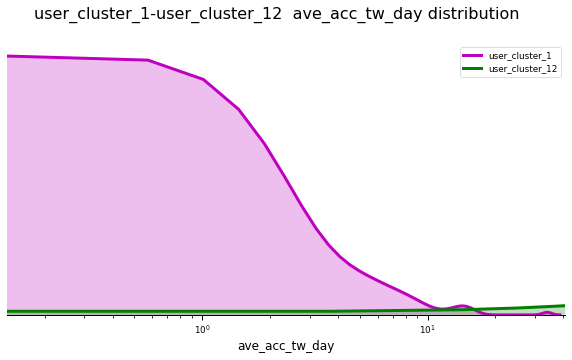

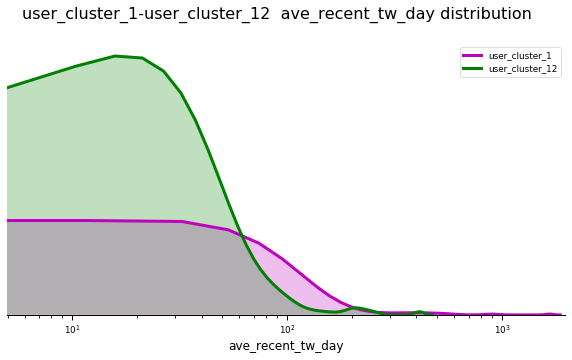

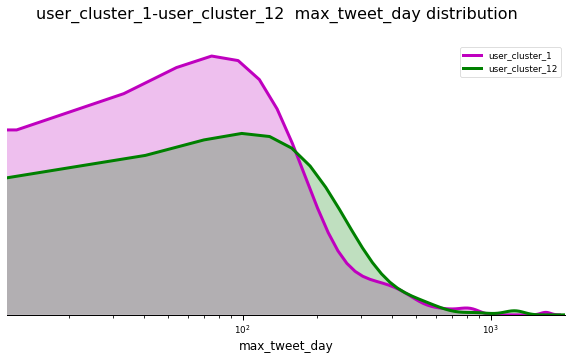

...

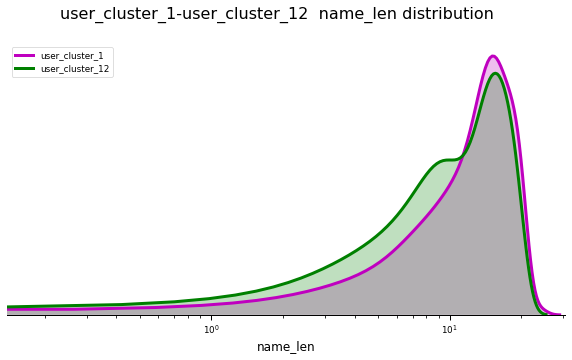

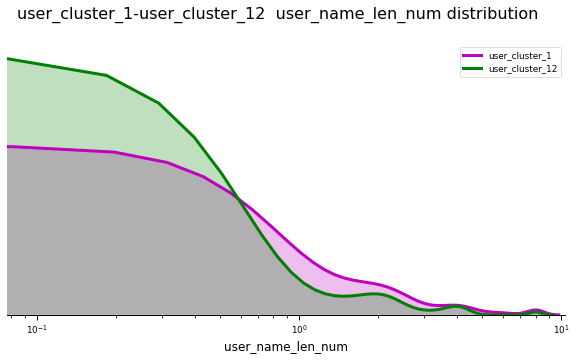

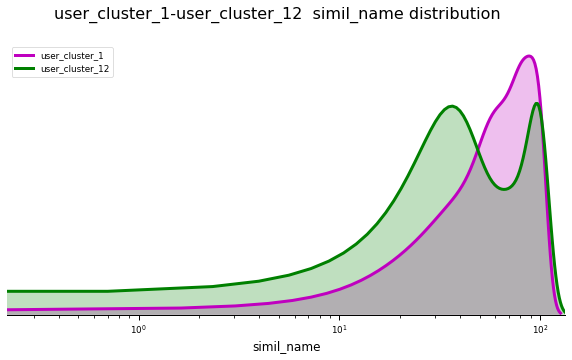

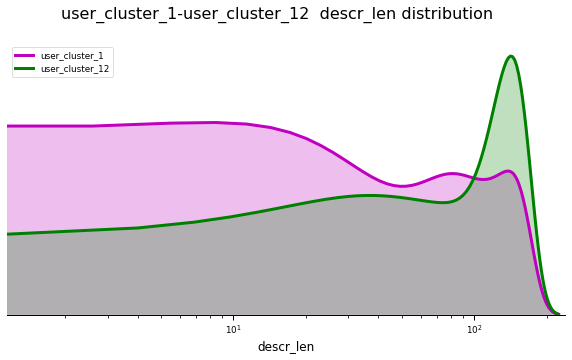

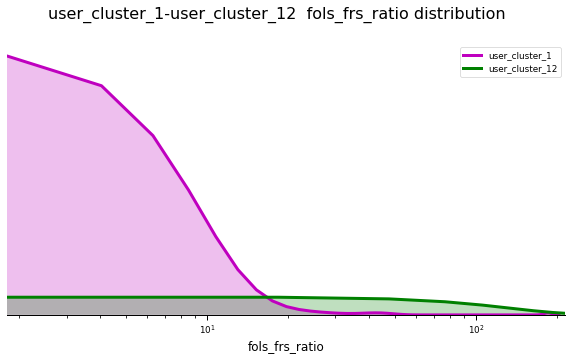

In [162]:
for feat in features:
    plot_feat_comp(user_cluster_1, user_cluster_12, feat, prt=False, log=True)

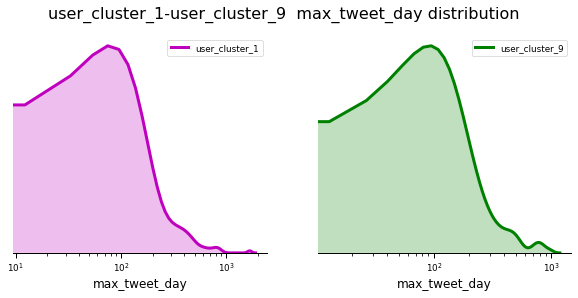

In [153]:
feat = 'max_tweet_day'
plot_feat_comp_2_graph(user_cluster_1, user_cluster_9, feat, prt=False, log=True)

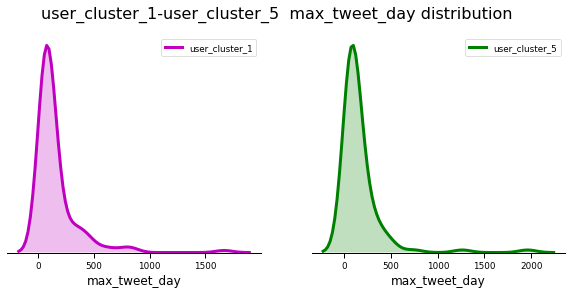

In [139]:
feat = 'max_tweet_day'
plot_feat_comp_2_graph(user_cluster_1, user_cluster_5, feat, prt=False, log=False)